# Week 4 - Semantic & Influence Networks

This week, we explore the representation and analysis of semantic and influence networks. We begin by introducing you to some straightforward approaches to network analysis. We then begin to illustrate them with word networks that we can analyze to understand the structure of how words connect with one another, and the dynamics of how their meanings flow through a discursive system. For example, we can define links between words as a function of their co-presence within a document, chapter, paragraph, sentence, noun phrase or continuous bag of words. We can also define links as a function of words that rely on one another within a directed dependency parse, or links between extracted Subjects, Verbs and Objects, or nouns and the adjectives that modify them (or verbs and the adverbs that modify them). Rendering words linked as a network or discrete topology allows us to take advantage of the network analysis metrics like centrality and community.

Texts also represent moves in a social game, and we can analyze the interchange of words and phrases within them in order to understand more about the relationships between people, groups and organizations that interact with one another. For example, who influences whom? And in a singular conversation--like a discussion of tweets on comments in Facebook--or over vast stretches of time (e.g., How much was Kant influenced by Aristotle? by Plato? Was _Chinatown_ director Robert Towne influenced by Sophocles?) We will do this by extracting conversational moves from text. But note that the similarity measures from last week's homework can also be used to represent a matrix of similarities--and potential influences--from one document to another. Rendering social actors or documentary events (e.g., a book) linked as a network or discrete topology allows us to take advantage of the wide range of metrics and models developed for network analysis. These include measurement of network centrality, density and modularity, "block modeling" structurally equivalent relationships, and sophisticated graphical renderings of networks or network partitions that allow us to visually interrogate their structure and complexity of social relations. Moreover, we can link explicit social interactions (e.g., "friendship" on Facebook, coupling in a romantic relationship, etc.) with semantic networks to better make sense of how pepole (inter)act in the world. 

For this notebook we will use the following packages:

In [130]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
import lucem_illud_2020 #pip install -U git+git://github.com/Computational-Content-Analysis-2020/lucem_illud_2020.git

#All these packages need to be installed from pip

#This will be doing most of the work
import networkx as nx

import sklearn #For generating some matrices
import pandas #For DataFrames
import numpy as np #For arrays
import matplotlib.pyplot as plt #For plotting
import seaborn #Makes the plots look nice
import scipy #Some stats
import nltk #a little language code
from IPython.display import Image #for pics

import pickle #if you want to save layouts
import os

%matplotlib inline

# An Introduction to networks in *networkx*

We will primarily be dealing with graphs in this notebook, so lets first go over how to use them.

To start with lets create an undirected graph:

In [2]:
g = nx.Graph()
g

We can add nodes. These are all named, like entries in a dictionary.

In [3]:
g.add_node(1)
g.add_node(2)
g.add_node(3)

Now we have 3 vertices:

In [4]:
len(g.nodes)

3

Or if we want to get more information about the graph:

In [5]:
print(nx.info(g))

Name: 
Type: Graph
Number of nodes: 3
Number of edges: 0
Average degree:   0.0000


We can give nodes properties, like name or type

In [6]:
g.nodes[1]

{}

In [7]:
g.nodes[1]['type'] = 'NN'

In [8]:
g.nodes[1]

{'type': 'NN'}

In [9]:
g.nodes[2]['name'] = 'dog'

In [10]:
g.nodes[2]

{'name': 'dog'}

Still pretty boring...

Lets add a couple of edges. Notice that we use the ids, but not any of the properties:

In [11]:
g.add_edges_from([(1, 2), (2, 3), (3, 1), (1,4)])
print(nx.info(g))

Name: 
Type: Graph
Number of nodes: 4
Number of edges: 4
Average degree:   2.0000


Note how the summary has changed. Moreover, there's one additional node, because we asked for an edge to 4.

We can also give the edges properties like weights:

In [12]:
g.edges[1, 2]['weight'] = 2
g.edges[1, 4]['weight'] = 2
g.edges[1, 4]

{'weight': 2}

Let's visualize our graph now:

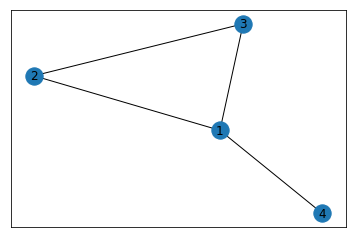

In [13]:
nx.draw_networkx(g)
plt.savefig("test.png")

Very exciting :-).

There are many things to do with the graph once we have created it, some of which we will explore here with a word semantic network.

First let's load some data: the Grimmer Senate press release corpus:

In [14]:
senReleasesDF = pandas.read_csv('../data/senReleasesTraining.csv', index_col = 0)
senReleasesDF[:3]

,download_url,html_url,name,path,text,targetSenator
0,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,01Apr2005Kennedy14.txt,raw/Kennedy/01Apr2005Kennedy14.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE...,Kennedy
1,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,01Aug2005Kennedy12.txt,raw/Kennedy/01Aug2005Kennedy12.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE...,Kennedy
2,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,01Aug2006Kennedy10.txt,raw/Kennedy/01Aug2006Kennedy10.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE ...,Kennedy


We will be extracting sentences, as well as tokenizing and stemming. (You should be able to do this in your sleep now).

In [15]:
senReleasesDF['tokenized_sents'] = senReleasesDF['text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
senReleasesDF['normalized_sents'] = senReleasesDF['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

Let's begin by looking at words that co-occur in the same sentences:

In [2]:
def wordCooccurrence(sentences, makeMatrix = False):
    words = set()
    for sent in sentences:
        words |= set(sent)
    wordLst = list(words)
    wordIndices = {w: i for i, w in enumerate(wordLst)}
    wordCoCounts = {}
    #consider a sparse matrix if memory becomes an issue
    coOcMat = np.zeros((len(wordIndices), len(wordIndices)))
    for sent in sentences:
        for i, word1 in enumerate(sent):
            word1Index = wordIndices[word1]
            for word2 in sent[i + 1:]:
                coOcMat[word1Index][wordIndices[word2]] += 1
    if makeMatrix:
        return coOcMat, wordLst
    else:
        coOcMat = coOcMat.T + coOcMat
        g = nx.convert_matrix.from_numpy_matrix(coOcMat)
        g = nx.relabel_nodes(g, {i : w for i, w in enumerate(wordLst)})
        return g

First, build a graph based on word cooccurences in the first 100 press releases.

In [17]:
g = wordCooccurrence(senReleasesDF['normalized_sents'][:100].sum())

Total number of vertices:

In [18]:
len(g.nodes)

4710

Total number of edges:

In [19]:
len(g.edges)

179328

A part of the adjacency matrix of cleaned word by press releases:

In [20]:
nx.to_numpy_matrix(g)[:10, :10]

matrix([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 2., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

We can save the graph and read it later, although this is slow if there are many edges or nodes, so we will filter first, as we will demonstrate below.

In [21]:
#nx.write_graphml(g, '../data/Obama_words.graphml')

Alternatively, we can build graphs starting with a two-mode network. Let's again use the document-word frequency matrix that we used in week 3.

In [4]:
def tokenize(text):
    tokenlist = lucem_illud_2020.word_tokenize(text)
    normalized = lucem_illud_2020.normalizeTokens(tokenlist)
    return normalized

In [5]:
import sklearn.feature_extraction
# in case we get a module not found error

In [24]:
senVectorizer = sklearn.feature_extraction.text.CountVectorizer(tokenizer = tokenize)
senVects_incidence = senVectorizer.fit_transform(senReleasesDF['text'][:100])

In [25]:
senVects_incidence.shape

(100, 4710)

We need to turn the incidence matrix into a network. Note the use of bipartite as an attribute--this is how you need to tell networkx the graph is bipartite:

In [26]:
g_2mode = nx.Graph()

#define all the nodes
g_2mode.add_nodes_from((senVectorizer.get_feature_names()[i] for i in range(senVects_incidence.shape[1])), bipartite = 'word')
g_2mode.add_nodes_from(range(senVects_incidence.shape[0]), bipartite = 'doc')

#add all the edges
g_2mode.add_edges_from(((d, senVectorizer.get_feature_names()[w], {'weight' : senVects_incidence[d, w]}) for d, w in zip(*senVects_incidence.nonzero())))

In [27]:
print(nx.info(g_2mode))

Name: 
Type: Graph
Number of nodes: 4810
Number of edges: 21005
Average degree:   8.7339


A very popular layout algorithm for visualizing graphs is the Fruchterman-Reingold Algorithm (or spring layout), which uses a physical metaphor for lay-out. Nodes repel one another, and edges draw connected elements together like springs. The algorithm attempts to minimize the energy in such a system. For a large graph, however, the algorithm is computational demanding. 

Let's plot the bipartite network with a quick spring layout:

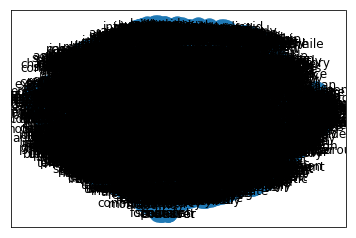

In [28]:
nx.draw_networkx(g_2mode)

With no filtering, this will not bring insight (see below). If we want even faster computation and tunable visualizations, check out [Pajek](http://mrvar.fdv.uni-lj.si/pajek/) or [gephi](https://gephi.org/).

A two-mode network can be easily transformed into two one-mode network, enabling words to be connected to other words via the number of documents that share them, or documents to be connected to other documents via the words they share:

In [29]:
def contractNetwork(g, targetType):
    g_mono = nx.Graph()
    g_mono.add_nodes_from(((n, d) for n, d in g_2mode.nodes(data = True) if d['bipartite'] == targetType))
    
    for n_outside in (n for n, d in g_2mode.nodes(data = True) if d['bipartite'] != targetType):
        neighbors = list((n for n in g.neighbors(n_outside) if g.nodes[n]['bipartite'] == targetType))
        for i, n1 in enumerate(neighbors):
            for n2 in neighbors[i+1:]:
                try:
                    g_mono.edges[n1, n2]['weight'] += 1
                except KeyError:
                    g_mono.add_edge(n1, n2, weight = 1)
    return g_mono

In [30]:
gDoc = contractNetwork(g_2mode, 'doc')

Let's first take a look at the document-to-document network:

In [31]:
print(nx.info(gDoc))

Name: 
Type: Graph
Number of nodes: 100
Number of edges: 4950
Average degree:  99.0000


Let's construct a visualization. It is not surprising that almost every document is connected to every other. We can use edge weight to distinguish document distance (modeled as attraction):

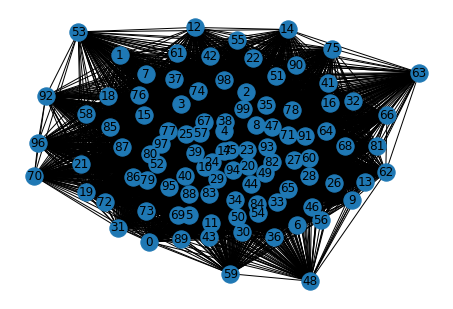

In [32]:
layout = nx.spring_layout(gDoc, k = 1/3, weight='weight', iterations= 50)
nx.draw(gDoc, pos = layout, labels = {n:n for n in gDoc.nodes()}) #Getting labels is a bit annoying

Lets draw the graph with high and low weight edges distinguished:

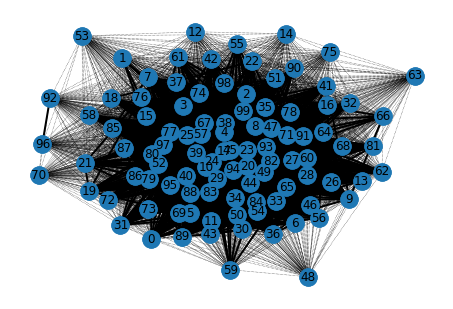

In [33]:
wMedian = np.median([d['weight'] for n1, n2, d in gDoc.edges(data = True)])
edgesHigh = [(n1, n2) for n1, n2, d in gDoc.edges(data = True) if d['weight'] > wMedian]
edgesLow = [(n1, n2) for n1, n2, d in gDoc.edges(data = True) if d['weight'] <= wMedian]
nx.draw(gDoc, pos = layout, labels = {n:n for n in gDoc.nodes()}, edgelist = edgesLow, style='dotted', width=.5)
nx.draw(gDoc, pos = layout, nodelist=None, edgelist = edgesHigh, width=2)

Now we can see why 53 and 63 are on the outside, while 39 and 23 are at the center. We can look at them:

In [34]:
print(len(senReleasesDF.iloc[63]['text']),"words:","\n",senReleasesDF.iloc[63]['text'].strip().replace('  ', '\n'))

314 words: 
 FOR IMMEDIATE RELEASE

Senator Kennedy issued the following statement this evening following Senator Kerrys apology

John Kerry s statement says it all
I wish the Bush administration brought as much energy and focus to trying to correct their mistakes in Iraq as it did in going after John Kerry


In [35]:
print(len(senReleasesDF.iloc[23]['text']),"words:","\n",senReleasesDF.iloc[23]['text'].strip().replace('  ', '\n'))

20603 words: 
 FOR IMMEDIATE RELEASE
REID

 We re sorry that we re starting a little bit late
but the House has some votes going
and so Leader Pelosi will be here and Congresswoman Solis real soon

 I m reminded of the story I learned as a little boy
When the kid was watching the sheep and he was supposed to yell
Wolf
when the wolf was coming
And he yelled
Wolf
as we know

Wolf
Wolf
and there was never any wolf
And finally when a wolf showed up
no one came

 And no matter how hard we try to be bipartisan here in Washington
with President Bush it s the proverbial cry for wolf

 As I said leaving the chamber last night
whatever he says
it s just the opposite

 And we re here today to talk about health care
But the cry of wolf is once again ringing in my ears because he keeps talking about how he wants to improve health care and we re now five years into this and there s been no improvement

 In fact
I hope the president mentions when he s in Tennessee today that there s almost a million 

Ah...those documents with the **most** words are unsprisingly the most central in this simple document network.

Now let's turn it around and look at the word-to-word network by documents. 

In [36]:
gWord = contractNetwork(g_2mode, 'word')
print(nx.info(gWord))

Name: 
Type: Graph
Number of nodes: 4710
Number of edges: 2063890
Average degree: 876.3864


First, let's reduce the number of words to a manageable size.

In [37]:
wMean = np.mean([d['weight'] for n1, n2, d in gWord.edges(data = True)])
wMean

1.7778965933261948

We are going to return to the sentence cooccurence graph, as it suggests many more meaningful (more local) associations. But without filtering, it is too large. Let's first drop all the edges with weight below 25, then drop all the isolates. You are recommended to play with the weight here to see how the graph might look different.

In [38]:
g = wordCooccurrence(senReleasesDF['normalized_sents'][:100].sum())

In [40]:
g.remove_edges_from([(n1, n2) for n1, n2, d in g.edges(data = True) if d['weight'] <= 25])

In [41]:
g.remove_nodes_from(list(nx.isolates(g))) #since we are changing the graph list() evaluates the isolates first

In [45]:
#pip install -U git+git://github.com/networkx/networkx.git

import community # --> http://perso.crans.org/aynaud/communities/
import networkx as nx
from networkx.algorithms import community
from community import community_louvain

In [110]:
from networkx.algorithms.community.centrality import girvan_newman


In [111]:
from community import modularity_max


ImportError: cannot import name 'modularity_max' from 'community' (C:\Users\iarak\Anaconda3\Anaconda\lib\site-packages\community\__init__.py)

Let us use this oppurtunity to introduce a concept of finding communities in graphs: a popular one is the modularity measure, introduced in: Clauset, A., Newman, M. E., & Moore, C. “Finding community structure in very large networks.” Physical Review E 70(6), 2004.

networkx implements this through the above method. It yields sets of nodes, one for each community.

In [79]:
c

NameError: name 'c' is not defined

We can also remove those words that show up in many documents...those with many connections (note that this has a similar effect to selecting those with a high tf.idf score). Note that for this case we get the same graph; this is just to demonstrate the different kinds of node dropping and graph changes we can do.

In [46]:
giant = nx.Graph(giant)

In [47]:
giant.remove_nodes_from([n for n in giant.nodes if len(set(giant.neighbors(n))) >= 2000]) 
giant.remove_nodes_from(list(nx.isolates(giant)))
print(nx.info(giant))

Name: 
Type: Graph
Number of nodes: 158
Number of edges: 458
Average degree:   5.7975


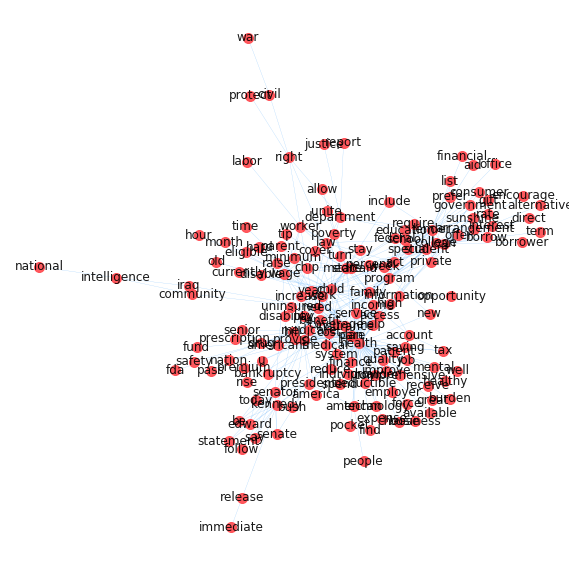

In [48]:
layout = nx.spring_layout(giant, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

We can continue to trim globally to investigate the structure of words at alternative slices of network density. 

Moreover, we can find cliques, or completely connected sets of nodes. 

In [102]:
print(', '.join(max(nx.clique.find_cliques(giant_h), key = lambda x: len(x))))

be, know, like, get, have, right, think, come, yes, man


In [55]:
print(', '.join(max(nx.clique.find_cliques(giant_sfi), key = lambda x: len(x))))

be, come, have, know


In [103]:
print(', '.join(max(nx.clique.find_cliques(giant_r), key = lambda x: len(x))))

be, know, tell, come, have, think, go, get


Now lets look at a subgraph of the network, those nodes that are within 1 or 2 network steps of 'america'. 

In [50]:
americanNeighbors = giant.neighbors('american')
g_american = giant.subgraph(americanNeighbors)
print(nx.info(g_american))

Name: 
Type: Graph
Number of nodes: 5
Number of edges: 11
Average degree:   4.4000


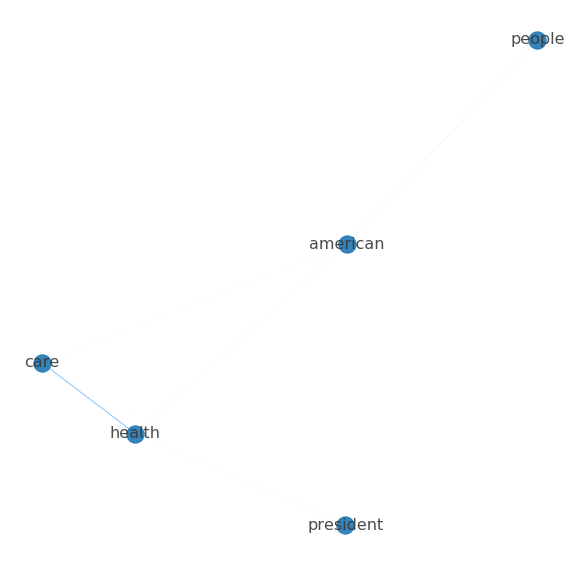

In [51]:
layout_amer = nx.spring_layout(g_american, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
maxWeight = max((d['weight'] for n1, n2, d in g_american.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in g_american.edges(data = True)))
nx.draw(g_american, ax = ax, pos = layout_amer, labels = {n:n for n in g_american.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in g_american.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:sky blue',
        cmap = plt.get_cmap('plasma')) 

In [52]:
americanNeighbors = gWord.neighbors('american')
americanNeighborsPlus1 = set(americanNeighbors)
for n in americanNeighbors:
    americanNeighborsPlus1 |= set(giant.neighbors(n))
    
#for x in americanNeighborsPlus1:
#    print(x)

In [53]:
g_american2 = giant.subgraph(americanNeighborsPlus1)
print(nx.info(g_american2))

Name: 
Type: Graph
Number of nodes: 154
Number of edges: 447
Average degree:   5.8052


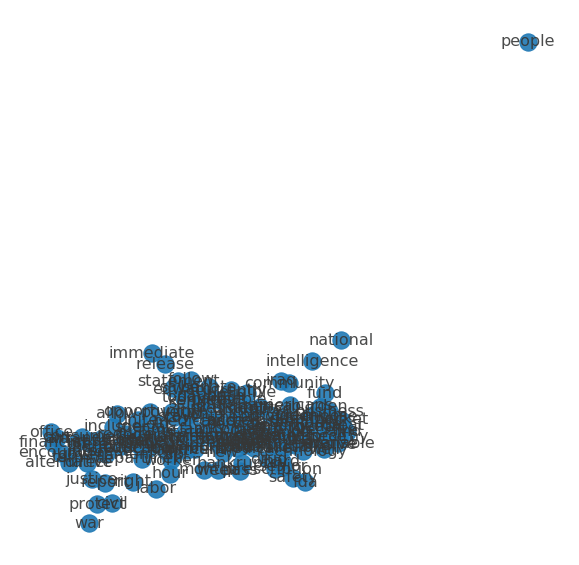

In [54]:
layout_amer = nx.spring_layout(g_american2, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
centralities_amer = nx.eigenvector_centrality(g_american2)
maxC = max(centralities_amer.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in g_american2.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in g_american2.edges(data = True)))
nx.draw(g_american2, ax = ax, pos = layout_amer, labels = {n:n for n in g_american2.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in g_american2.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:sky blue',
        cmap = plt.get_cmap('plasma')) 

## <span style="color:red">*Exercise 1*</span>

<span style="color:red">Construct cells immediately below this that render networks to meaningfully characterize the structure of words and documents (or subdocuments like chapters or paragraphs) from your corpus. What are useful filters and thresholds and what semantic structures do they reveal that give insight into the social world and social game inscribed in your corpus? Interrogate interesting subgraphs of your network and detail what they reveal about the semantic space involved.

 I looked at just all romance movies and much like the Grimmer Senate press releases corpus from the examples in the assignment, when looking at all romance movies, the document with most words are the most central in this simple document network. Document number 90 and 64, with fewer words, are on the side and bottom farther away from the rest.

In [7]:
import re
import zipfile
import os
import sys

In [8]:
corpus_name = r"C:\Users\iarak\OneDrive\Desktop\CCA\Movies"

In [9]:
def loadcorpus(corpus_name, corpus_style="text"):
    texts_raw = {}
    for file in os.listdir(corpus_name + "/"):
        if corpus_style in file:
            print(file)
            zfile = zipfile.ZipFile(corpus_name + "/" + file)
            for file in zfile.namelist():
                texts_raw[file] = []
                with zfile.open(file) as f:
                    for line in f:
                        texts_raw[file].append(line)
    return texts_raw

In [10]:
movie_raw = loadcorpus(corpus_name)

text_00_myn.zip
text_01_ote.zip
text_02_mqu.zip
text_03_mnq.zip
text_04_mlq.zip
text_05_nko.zip
text_06_jfy.zip
text_07_oma.zip
text_08_loh.zip
text_09_oii.zip
text_10_aoy.zip
text_11_uoy.zip
text_12_rcq.zip
text_13_idi.zip
text_14_lnc.zip
text_15_guo.zip
text_16_qll.zip
text_17_arp.zip
text_18_jfj.zip
text_19_gvc.zip
text_20_cde.zip
text_21_fqa.zip
text_22_etp.zip
text_23_fmh.zip
text_24_ywo.zip
text_25_byg.zip
text_26_ngj.zip
text_27_fle.zip
text_28_rfy.zip
text_29_oye.zip
text_30_wkp.zip
text_31_akv.zip
text_32_ldf.zip
text_33_kje.zip


In [11]:
zfile = zipfile.ZipFile(corpus_name + "/sources_movies.zip")
source = []

In [12]:
for file in zfile.namelist():
    with zfile.open(file) as f:
        for line in f:
            source.append(line)

In [13]:
def clean_raw_text(raw_texts):
    clean_texts = []
    for text in raw_texts:
        try:
            text = text.decode("utf-8")
            clean_text = text.replace(" \'m", "'m").replace(" \'ll", "'ll").replace(" \'re", "'re").replace(" \'s", "'s").replace(" \'re", "'re").replace(" n\'t", "n't").replace(" \'ve", "'ve").replace(" /'d", "'d")
            clean_texts.append(clean_text)
        except AttributeError:
            # print("ERROR CLEANING")
            # print(text)
            continue
        except UnicodeDecodeError:
            # print("Unicode Error, Skip")
            continue
    return clean_texts

In [14]:
movie_texts = {}

In [15]:
for files in movie_raw:
    if len(movie_texts) > 1000:
        break
    movies = clean_raw_text(movie_raw[files][1:])
    for movie in movies:
        txts = lucem_illud_2020.word_tokenize(movie)
        try:
            movie_texts[txts[0][2:]] = movie[1:]
        except IndexError:
            continue

In [85]:
movie_tokens = {}

In [86]:
for files in movie_raw:
    if len(movie_tokens) > 1000:
        break
    movies = clean_raw_text(movie_raw[files][1:])
    for movie in movies:
        txts = lucem_illud_2020.word_tokenize(movie)
        try:
            movie_tokens[txts[0][2:]] = txts[1:]
        except IndexError:
            continue

In [247]:
movies = clean_raw_text(movie_raw[files][1:])

In [16]:
import pandas as pd

In [17]:
movie_df = pd.DataFrame(columns=["Movie Name", "Genre", "Year", "Country", "Text"])

In [87]:
movie_dff = pd.DataFrame(columns=["Movie Name", "Genre", "Year", "Country", "Tokenized"])

In [18]:
for movie in source[3:]:
    try:
        tid, fileid, total_words, genre, year, lang, country, imdb, title = movie.decode("utf-8").split("\t")
    except UnicodeDecodeError:
        continue
    try:
        movie_df.loc[fileid.strip()] = [title.strip(), genre.strip(), year.strip(), country.strip(), movie_texts[fileid.strip()]]
    except KeyError:
        continue

In [88]:
for movie in source[3:]:
    try:
        tid, fileid, total_words, genre, year, lang, country, imdb, title = movie.decode("utf-8").split("\t")
    except UnicodeDecodeError:
        continue
    try:
        movie_dff.loc[fileid.strip()] = [title.strip(), genre.strip(), year.strip(), country.strip(),  movie_tokens[fileid.strip()] ]
    except KeyError:
        continue

In [89]:
movie_dff.head()

,Movie Name,Genre,Year,Country,Tokenized
3435788,Born Reckless,"Crime, Drama, Film-Noir",1930,"English, Italian, French","[Louis, Louis, Beretti, Shh, Put, that, out, y..."
6880640,Dishonored,"Drama, Romance, War",1931,English,"[I, thought, I, smelled, gas, That, 's, three,..."
5482259,Indiscreet,"Comedy, Drama, Musical",1931,English,"[Subtitles, Lu, s, Filipe, Bernardes, Wait, Yo..."
5192597,The Stolen Jools,"Comedy, Short",1931,English,"[Subtitles, Lu, s, Filipe, Bernardes, Hello, W..."
3982760,College Humor,Comedy,1933,English,"[Play, ball, Although, the, game, seems, uphil..."
...,...,...,...,...,...
6937557,The Bigfoot Project,Comedy,2017,"English, English","[Well, every, so, often, we, come, across, one..."
6975301,The Black Room,"Comedy, Horror",2017,English,"[No, Leave, us, alone, I, know, what, day, it,..."
6980015,Vir Das: Abroad Understanding,Comedy,2017,English,"[What, you, see, right, now, Is, a, man, in, a..."
6932068,The Bye Bye Man,"Horror, Thriller",2017,English,"[27;7310;TOOLONG, VEHICLEAPPROACHING, @music_s..."


In [19]:
movie_df.head()

,Movie Name,Genre,Year,Country,Text
3435788,Born Reckless,"Crime, Drama, Film-Noir",1930,"English, Italian, French",@3435788 Louis ? Louis ? - Beretti ? - Shh ! P...
6880640,Dishonored,"Drama, Romance, War",1931,English,@6880640 I thought I smelled gas . That's thre...
5482259,Indiscreet,"Comedy, Drama, Musical",1931,English,@5482259 Subtitles : Lu ? s Filipe Bernardes W...
5192597,The Stolen Jools,"Comedy, Short",1931,English,@5192597 Subtitles : Lu ? s Filipe Bernardes H...
3982760,College Humor,Comedy,1933,English,@3982760 Play ball Although the game seems uph...


In [195]:
len(movie_df)

776

In [220]:
movie_df['Genre'].unique()

array(['Crime, Drama, Film-Noir', 'Drama, Romance, War',
       'Comedy, Drama, Musical', 'Comedy, Short', 'Comedy',
       'Drama, Romance', 'Comedy, Drama', 'Western', 'Romance',
       'Family, Comedy, Animation', 'Animation, Comedy, Family',
       'Drama, History, Western', 'Adventure, Drama, Romance', 'Drama',
       'Horror, Sci-Fi, Thriller', 'Comedy, Musical',
       'Biography, Drama, Music', 'Animation, Short, Comedy',
       'Comedy, Crime, Drama', 'Documentary, Short',
       'Drama, Music, Romance', 'Drama, Thriller, War',
       'Film-Noir, Thriller', 'Comedy, Fantasy, Romance',
       'Comedy, Musical, Romance', 'Comedy, Music, Romance',
       'Drama, Film-Noir, Romance', 'Drama, History',
       'Drama, Film-Noir, Mystery', 'Drama, Film-Noir',
       'Drama, Family, Western', 'Crime, Drama',
       'Biography, Comedy, Musical', 'Drama, Adventure',
       'Drama, Film-Noir, Thriller', 'Action, Romance, Western',
       'Drama, Musical, Romance', 'Musical, Western',
   

In [91]:
movie_df['tokenized_sents'] = movie_df['Text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
movie_df['normalized_sents'] = movie_df['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

In [225]:
movie_df['Genre'].str.contains('Romance', na=False).sum()

114

In [144]:
movie_df.head()

,Movie Name,Genre,Year,Country,Text,tokenized_sents,normalized_sents
3435788,Born Reckless,"Crime, Drama, Film-Noir",1930,"English, Italian, French",@3435788 Louis ? Louis ? - Beretti ? - Shh ! P...,"[[@3435788, Louis], [Louis], [Beretti], [Shh],...","[[@3435788, louis], [louis], [beretti], [shh],..."
6880640,Dishonored,"Drama, Romance, War",1931,English,@6880640 I thought I smelled gas . That's thre...,"[[@6880640, I, thought, I, smelled, gas], [Tha...","[[@6880640, think, smell, gas], [year], [decen..."
5482259,Indiscreet,"Comedy, Drama, Musical",1931,English,@5482259 Subtitles : Lu ? s Filipe Bernardes W...,"[[@5482259, Subtitles, Lu], [s], [Filipe, Bern...","[[@5482259, subtitle, lu], [s], [filipe, berna..."
5192597,The Stolen Jools,"Comedy, Short",1931,English,@5192597 Subtitles : Lu ? s Filipe Bernardes H...,"[[@5192597, Subtitles], [Lu], [s], [Filipe, Be...","[[@5192597, subtitle], [lu], [s], [filipe, ber..."
3982760,College Humor,Comedy,1933,English,@3982760 Play ball Although the game seems uph...,"[[@3982760, Play, ball], [Although, the, game,...","[[@3982760, play, ball], [game, uphill, wo, le..."



To generate more interesting results, I discuss five cases here, namely romance, comedy, horror, drama, sci-fi and the mix of these five. Comparing and contrasting will allow me to learn how the text networks of the five sectors are different from each other. And, also how each of the network contrasts with the mix network.
I take 10 scripts at random from each vector, the Mix dataframe contains all the 50 articles. But this took quite a long time to run so only took 3 genres and 5 scripts in each.


In [20]:
movie_romance = movie_df[movie_df['Genre'].str.contains('Romance', na=False)] #114 movies

In [111]:
movie_war = movie_df[movie_df['Genre'].str.contains('War', na=False)] #114 movies

In [155]:
movie_comedy = movie_df[movie_df['Genre'].str.contains('Comedy', na=False)] #245 movies

In [21]:
movie_scifi = movie_df[movie_df['Genre'].str.contains('Sci-Fi', na=False)] #43 movies

In [159]:
movie_drama = movie_df[movie_df['Genre'].str.contains('Drama', na=False)] #341 movies

In [22]:
movie_horror = movie_df[movie_df['Genre'].str.contains('Horror', na=False)] #110 movies

In [206]:
movie_romance_5 = movie_df[movie_df['Genre'].str.contains('Romance', na=False)].sample(n=5)

In [207]:
movie_comedy_5 = movie_df[movie_df['Genre'].str.contains('Comedy', na=False)].sample(n=5) #245 movies

In [27]:
movie_scifi_5 = movie_df[movie_df['Genre'].str.contains('Sci-Fi', na=False)].sample(n=5) #43 movies

In [208]:
movie_drama_5 = movie_df[movie_df['Genre'].str.contains('Drama', na=False)].sample(n=5) #341 movies

In [184]:
#movie_horror_5 = movie_df[movie_df['Genre'].str.contains('Horror', na=False)].sample(n=5) #110 movies

In [209]:
#Mix of 10 movies from the 5 genres
movie_mix_5 = pandas.concat([movie_romance_5,movie_comedy_5,movie_drama_5], axis=0)

In [28]:
movie_scifi_5['tokenized_sents'] = movie_scifi_5['Text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
movie_scifi_5['normalized_sents'] = movie_scifi_5['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

In [29]:
movie_scifi['tokenized_sents'] = movie_scifi['Text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
movie_scifi['normalized_sents'] = movie_scifi['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

C:\Users\iarak\Anaconda3\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\iarak\Anaconda3\Anaconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [29]:
movie_scifi['tokenized_sents'] = movie_scifi['Text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
movie_scifi['normalized_sents'] = movie_scifi['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

C:\Users\iarak\Anaconda3\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\iarak\Anaconda3\Anaconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [113]:
movie_war['tokenized_sents'] = movie_war['Text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
movie_war['normalized_sents'] = movie_war['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

C:\Users\iarak\Anaconda3\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\iarak\Anaconda3\Anaconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [57]:
movie_horror['tokenized_sents'] = movie_horror['Text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
movie_horror['normalized_sents'] = movie_horror['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

C:\Users\iarak\Anaconda3\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\iarak\Anaconda3\Anaconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [40]:
movie_romance['tokenizedt_sents'] = movie_romance['Movie Name'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
movie_romance['normalizedt_sents'] = movie_romance['tokenizedt_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

C:\Users\iarak\Anaconda3\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\iarak\Anaconda3\Anaconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [39]:
movie_romance['tokenized_sents'] = movie_romance['Text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
movie_romance['normalized_sents'] = movie_romance['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

C:\Users\iarak\Anaconda3\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\iarak\Anaconda3\Anaconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [26]:
def wordCooccurrence(sentences, makeMatrix = False):
    words = set()
    for sent in sentences:
        words |= set(sent)
    wordLst = list(words)
    wordIndices = {w: i for i, w in enumerate(wordLst)}
    wordCoCounts = {}
    #consider a sparse matrix if memory becomes an issue
    coOcMat = np.zeros((len(wordIndices), len(wordIndices)))
    for sent in sentences:
        for i, word1 in enumerate(sent):
            word1Index = wordIndices[word1]
            for word2 in sent[i + 1:]:
                coOcMat[word1Index][wordIndices[word2]] += 1
    if makeMatrix:
        return coOcMat, wordLst
    else:
        coOcMat = coOcMat.T + coOcMat
        g = nx.convert_matrix.from_numpy_matrix(coOcMat)
        g = nx.relabel_nodes(g, {i : w for i, w in enumerate(wordLst)})
        return g

In [187]:
g_romance = wordCooccurrence(movie_romance_10['normalized_sents'][:100].sum())
g_comedy = wordCooccurrence(movie_comedy_10['normalized_sents'][:100].sum())
g_scifi = wordCooccurrence(movie_scifi_10['normalized_sents'][:100].sum())
g_drama = wordCooccurrence(movie_drama_10['normalized_sents'][:100].sum())
g_horror = wordCooccurrence(movie_horror_10['normalized_sents'][:100].sum())
g_mix = wordCooccurrence(movie_mix_10['normalized_sents'][:100].sum())

In [210]:
g_rom5 = wordCooccurrence(movie_romance_5['normalized_sents'][:100].sum())
g_com5 = wordCooccurrence(movie_comedy_5['normalized_sents'][:100].sum())
g_dra5 = wordCooccurrence(movie_drama_5['normalized_sents'][:100].sum())
g_mix5 = wordCooccurrence(movie_mix_5['normalized_sents'][:100].sum())

In [188]:
print(len(g_romance.nodes),len(g_romance.edges))
print(len(g_comedy.nodes),len(g_comedy.edges))
print(len(g_scifi.nodes),len(g_scifi.edges))
print(len(g_drama.nodes),len(g_drama.edges))
print(len(g_horror.nodes),len(g_horror.edges))
print(len(g_mix.nodes),len(g_mix.edges))

4667 30102
5092 36107
4082 23542
4300 49818
3893 24597
12004 145873


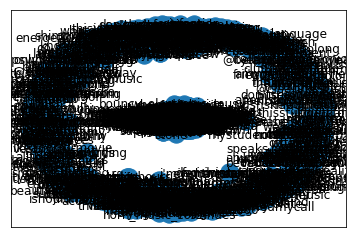

In [189]:
nx.draw_networkx(g_romance)

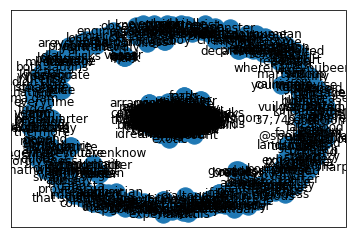

In [211]:
nx.draw_networkx(g_rom5)

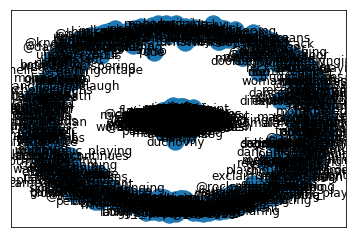

In [190]:
nx.draw_networkx(g_comedy)

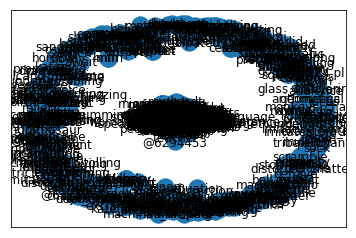

In [196]:
nx.draw_networkx(g_scifi)

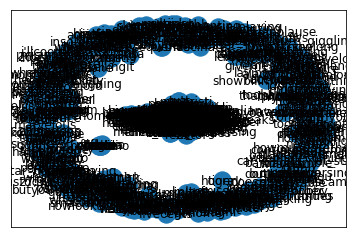

In [197]:
nx.draw_networkx(g_drama)

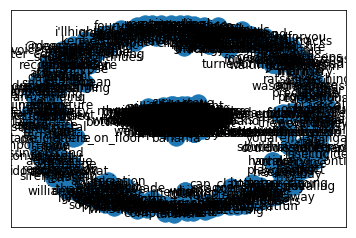

In [198]:
nx.draw_networkx(g_horror)

In [200]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer

In [58]:
def tokenize(text):
    tokenlist = nltk.word_tokenize(text)
    normalized = lucem_illud_2020.normalizeTokens(tokenlist)
    return normalized

In [59]:
senVectorizer = sklearn.feature_extraction.text.CountVectorizer(tokenizer = tokenize)

In [204]:
senVectorizer = sklearn.feature_extraction.text.CountVectorizer(tokenizer = tokenize)
senVects_incidence_rom10 = senVectorizer.fit_transform(movie_romance_10['Text'])
senVects_incidence_com10 = senVectorizer.fit_transform(movie_comedy_10['Text'])
senVects_incidence_sci10 = senVectorizer.fit_transform(movie_scifi_10['Text'])
senVects_incidence_dra10 = senVectorizer.fit_transform(movie_drama_10['Text'])
senVects_incidence_hor10 = senVectorizer.fit_transform(movie_horror_10['Text'])
senVects_incidence_mix10 = senVectorizer.fit_transform(movie_mix_10['Text'])

TypeError: normalizeTokens() got an unexpected keyword argument 'stopwordLst'

In [213]:
senVectorizer = sklearn.feature_extraction.text.CountVectorizer(tokenizer = tokenize)
senVects_incidence_rom5 = senVectorizer.fit_transform(movie_romance_5['Text'])
senVects_incidence_com5 = senVectorizer.fit_transform(movie_comedy_5['Text'])
senVects_incidence_dra5 = senVectorizer.fit_transform(movie_drama_5['Text'])
senVects_incidence_mix5 = senVectorizer.fit_transform(movie_mix_5['Text'])

Name: 
Type: Graph
Number of nodes: 2204
Number of edges: 3434
Average degree:   3.1162


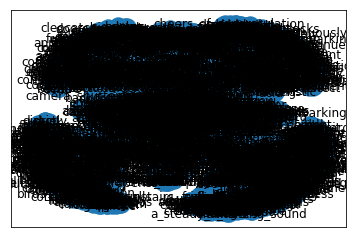

In [214]:
g_2mode_rom5 = nx.Graph()

#define all the nodes
g_2mode_rom5.add_nodes_from((senVectorizer.get_feature_names()[i] for i in range(senVects_incidence_rom5.shape[1])), bipartite = 'word')
g_2mode_rom5.add_nodes_from(range(senVects_incidence_rom5.shape[0]), bipartite = 'doc')
#add all the edges
g_2mode_rom5.add_edges_from(((d, senVectorizer.get_feature_names()[w], {'weight' : senVects_incidence_rom5[d, w]}) for d, w in zip(*senVects_incidence_rom5.nonzero())))

print(nx.info(g_2mode_rom5))

nx.draw_networkx(g_2mode_rom5)

Name: 
Type: Graph
Number of nodes: 2788
Number of edges: 4051
Average degree:   2.9060


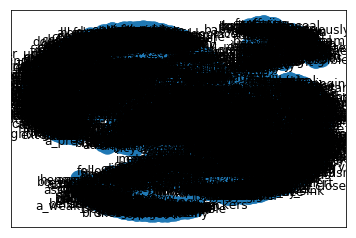

In [215]:
g_2mode_com5 = nx.Graph()

#define all the nodes
g_2mode_com5.add_nodes_from((senVectorizer.get_feature_names()[i] for i in range(senVects_incidence_com5.shape[1])), bipartite = 'word')
g_2mode_com5.add_nodes_from(range(senVects_incidence_com5.shape[0]), bipartite = 'doc')
#add all the edges
g_2mode_com5.add_edges_from(((d, senVectorizer.get_feature_names()[w], {'weight' : senVects_incidence_com5[d, w]}) for d, w in zip(*senVects_incidence_com5.nonzero())))

print(nx.info(g_2mode_com5))

nx.draw_networkx(g_2mode_com5)

Name: 
Type: Graph
Number of nodes: 3365
Number of edges: 4933
Average degree:   2.9319


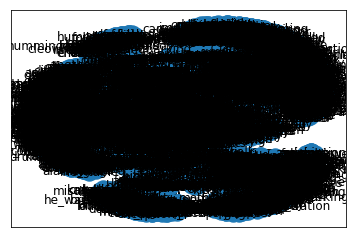

In [216]:
g_2mode_dra5 = nx.Graph()

#define all the nodes
g_2mode_dra5.add_nodes_from((senVectorizer.get_feature_names()[i] for i in range(senVects_incidence_dra5.shape[1])), bipartite = 'word')
g_2mode_dra5.add_nodes_from(range(senVects_incidence_dra5.shape[0]), bipartite = 'doc')
#add all the edges
g_2mode_dra5.add_edges_from(((d, senVectorizer.get_feature_names()[w], {'weight' : senVects_incidence_dra5[d, w]}) for d, w in zip(*senVects_incidence_dra5.nonzero())))

print(nx.info(g_2mode_dra5))

nx.draw_networkx(g_2mode_dra5)

Name: 
Type: Graph
Number of nodes: 5765
Number of edges: 12418
Average degree:   4.3081


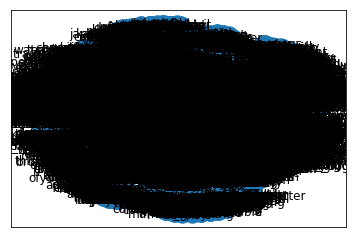

In [217]:
g_2mode_mix5 = nx.Graph()

#define all the nodes
g_2mode_mix5.add_nodes_from((senVectorizer.get_feature_names()[i] for i in range(senVects_incidence_mix5.shape[1])), bipartite = 'word')
g_2mode_mix5.add_nodes_from(range(senVects_incidence_mix5.shape[0]), bipartite = 'doc')
#add all the edges
g_2mode_mix5.add_edges_from(((d, senVectorizer.get_feature_names()[w], {'weight' : senVects_incidence_mix5[d, w]}) for d, w in zip(*senVects_incidence_mix5.nonzero())))

print(nx.info(g_2mode_mix5))

nx.draw_networkx(g_2mode_mix5)

# Document to Document

In [218]:
def contractNetwork(g, targetType):
    g_mono = nx.Graph()
    g_mono.add_nodes_from(((n, d) for n, d in g.nodes(data = True) if d['bipartite'] == targetType))
    
    for n_outside in (n for n, d in g.nodes(data = True) if d['bipartite'] != targetType):
        neighbors = list((n for n in g.neighbors(n_outside) if g.nodes[n]['bipartite'] == targetType))
        for i, n1 in enumerate(neighbors):
            for n2 in neighbors[i+1:]:
                try:
                    g_mono.edges[n1, n2]['weight'] += 1
                except KeyError:
                    g_mono.add_edge(n1, n2, weight = 1)
    return g_mono

In [219]:
gDoc_rom5 = contractNetwork(g_2mode_rom5, 'doc')
# Document to document network
print(nx.info(gDoc_rom5))

Name: 
Type: Graph
Number of nodes: 5
Number of edges: 10
Average degree:   4.0000


In [220]:
gDoc_com5 = contractNetwork(g_2mode_com5, 'doc')
# Document to document network
print(nx.info(gDoc_com5))

Name: 
Type: Graph
Number of nodes: 5
Number of edges: 10
Average degree:   4.0000


In [221]:
gDoc_dra5 = contractNetwork(g_2mode_dra5, 'doc')
# Document to document network
print(nx.info(gDoc_dra5))

Name: 
Type: Graph
Number of nodes: 5
Number of edges: 10
Average degree:   4.0000


In [222]:
gDoc_mix5 = contractNetwork(g_2mode_mix5, 'doc')
# Document to document network
print(nx.info(gDoc_mix5))

Name: 
Type: Graph
Number of nodes: 15
Number of edges: 105
Average degree:  14.0000


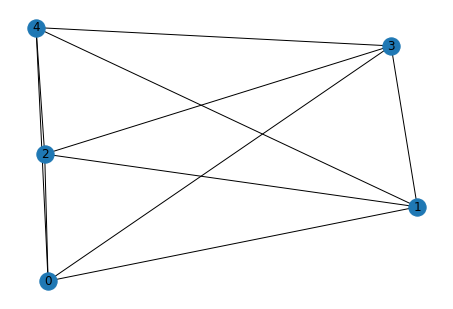

In [223]:
layout = nx.spring_layout(gDoc_rom5, k = 1/3, weight='weight', iterations= 50)
nx.draw(gDoc_rom5, pos = layout, labels = {n:n for n in gDoc_rom5.nodes()}) #Getting labels is a bit annoying

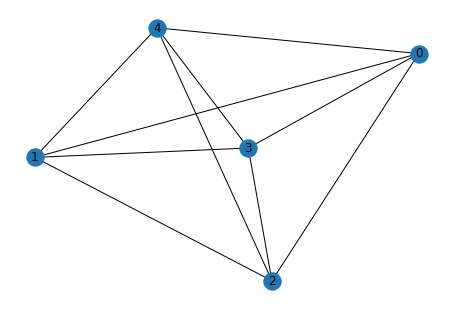

In [224]:
layout = nx.spring_layout(gDoc_com5, k = 1/3, weight='weight', iterations= 50)
nx.draw(gDoc_com5, pos = layout, labels = {n:n for n in gDoc_com5.nodes()}) #Getting labels is a bit annoying

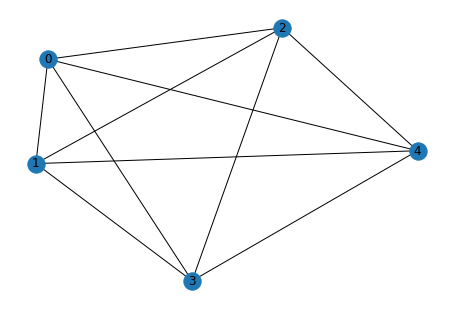

In [225]:
layout = nx.spring_layout(gDoc_dra5, k = 1/3, weight='weight', iterations= 50)
nx.draw(gDoc_dra5, pos = layout, labels = {n:n for n in gDoc_dra5.nodes()}) #Getting labels is a bit annoying

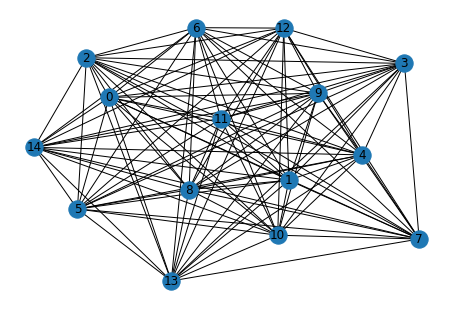

In [226]:
layout = nx.spring_layout(gDoc_mix5, k = 1/3, weight='weight', iterations= 50)
nx.draw(gDoc_mix5, pos = layout, labels = {n:n for n in gDoc_mix5.nodes()}) #Getting labels is a bit annoying

In [ ]:
layout_rom5 = nx.spring_layout(gDoc_rom5, k = 1/3, weight='weight', iterations= 50)
nx.draw(gDoc_rom5, pos = layout_rom5, labels = {n:n for n in gDoc_rom5.nodes()})

# Word to Word

In [227]:
gWord_rom5 = contractNetwork(g_2mode_rom5, 'word')
print(nx.info(gWord_rom5))

Name: 
Type: Graph
Number of nodes: 2199
Number of edges: 1059140
Average degree: 963.2924


In [228]:
gWord_com5 = contractNetwork(g_2mode_com5, 'word')
print(nx.info(gWord_com5))

Name: 
Type: Graph
Number of nodes: 2783
Number of edges: 1769938
Average degree: 1271.9641


In [229]:
gWord_dra5 = contractNetwork(g_2mode_dra5, 'word')
print(nx.info(gWord_dra5))

Name: 
Type: Graph
Number of nodes: 3360
Number of edges: 2594657
Average degree: 1544.4387


In [230]:
gWord_mix5 = contractNetwork(g_2mode_mix5, 'word')
print(nx.info(gWord_mix5))

Name: 
Type: Graph
Number of nodes: 5750
Number of edges: 4669555
Average degree: 1624.1930


In [231]:
# Reduce the word dimensionality
wMean_rom5 = np.mean([d['weight'] for n1, n2, d in gWord_rom5.edges(data = True)])
wMean_rom5

1.1589855920841436

In [232]:
wMean_com5 = np.mean([d['weight'] for n1, n2, d in gWord_com5.edges(data = True)])
wMean_com5

1.1059268742746922

In [233]:
wMean_dra5 = np.mean([d['weight'] for n1, n2, d in gWord_dra5.edges(data = True)])
wMean_dra5

1.1114363093079356

In [234]:
wMean_mix5 = np.mean([d['weight'] for n1, n2, d in gWord_mix5.edges(data = True)])
wMean_mix5

1.2996411863657245

In [ ]:
g_rom5.remove_edges_from([(n1, n2) for n1, n2, d in g_rom5.edges(data = True) if d['weight'] <= 5])
g_rom5.remove_nodes_from(list(nx.isolates(g_rom5))) 
giant_rom5_ = max(connected_component_subgraphs(g_rom5), key=len) 
print(nx.info(giant_rom5_))

In [ ]:
#MYCODE
layout_review = nx.spring_layout(giant_rom5_, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant_rom5_, ax = ax, pos = layout_review, labels = {n:n for n in giant_rom5_.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

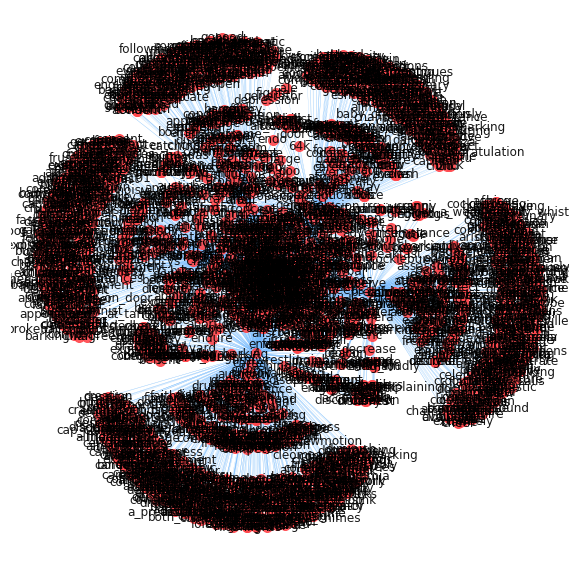

In [237]:
giant_rom5 = max(connected_component_subgraphs(g_2mode_rom5), key=len)

layout = nx.spring_layout(giant_rom5, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant_rom5, ax = ax, pos = layout, labels = {n:n for n in giant_rom5.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

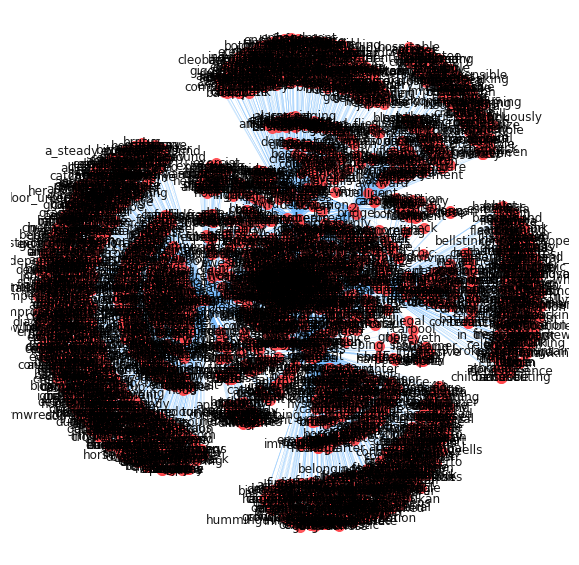

In [238]:
giant_com5 = max(connected_component_subgraphs(g_2mode_com5), key=len)

layout = nx.spring_layout(giant_com5, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant_com5, ax = ax, pos = layout, labels = {n:n for n in giant_com5.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

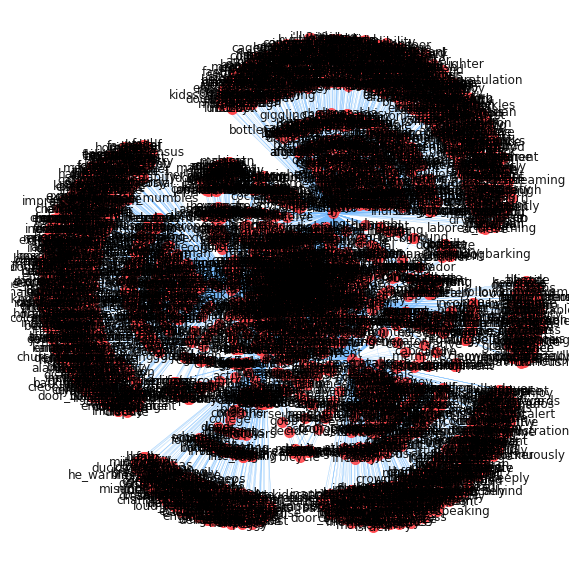

In [239]:
giant_dra5 = max(connected_component_subgraphs(g_2mode_dra5), key=len)

layout = nx.spring_layout(giant_dra5, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant_dra5, ax = ax, pos = layout, labels = {n:n for n in giant_dra5.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

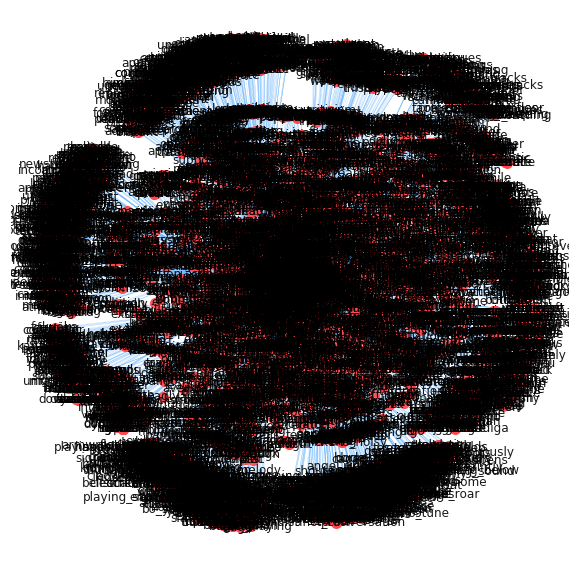

In [240]:
giant_mix5 = max(connected_component_subgraphs(g_2mode_mix5), key=len)

layout = nx.spring_layout(giant_mix5, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant_mix5, ax = ax, pos = layout, labels = {n:n for n in giant_mix5.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

## For, Scifi, Romance and Horror Movies 

In [30]:
g_sf = wordCooccurrence(movie_scifi['normalized_sents'][:100].sum())

In [97]:
g_r = wordCooccurrence(movie_romance['normalized_sents'][:100].sum())

In [61]:
g_h = wordCooccurrence(movie_horror['normalized_sents'][:100].sum())

In [50]:
g_rt = wordCooccurrence(movie_romance['normalizedt_sents'][:100].sum())

In [1]:
len(g_sf)

NameError: name 'g_sf' is not defined

In [32]:
g_sf.remove_edges_from([(n1, n2) for n1, n2, d in g_sf.edges(data = True) if d['weight'] <= 25])

In [98]:
g_r.remove_edges_from([(n1, n2) for n1, n2, d in g_r.edges(data = True) if d['weight'] <= 50])

In [62]:
g_h.remove_edges_from([(n1, n2) for n1, n2, d in g_h.edges(data = True) if d['weight'] <= 25])

In [45]:
g_rt.remove_edges_from([(n1, n2) for n1, n2, d in g_rt.edges(data = True) if d['weight'] <= 25])

In [33]:
g_sf.remove_nodes_from(list(nx.isolates(g_sf))) #since we are changing the graph list() evaluates the isolates first

In [99]:
g_r.remove_nodes_from(list(nx.isolates(g_r))) #since we are changing the graph list() evaluates the isolates first

In [63]:
g_h.remove_nodes_from(list(nx.isolates(g_h))) #since we are changing the graph list() evaluates the isolates first

In [47]:
g_rt.remove_nodes_from(list(nx.isolates(g_rt))) #since we are changing the graph list() evaluates the isolates first

In [6]:
def connected_component_subgraphs(G):
    for c in nx.connected_components(G):
        yield G.subgraph(c)

In [43]:
giant = max(connected_component_subgraphs(g), key=len) # keep just the giant connected component
print(nx.info(giant))

Name: 
Type: Graph
Number of nodes: 158
Number of edges: 458
Average degree:   5.7975


In [35]:
giant_sfi = max(connected_component_subgraphs(g_sf), key=len) # keep just the giant connected component
print(nx.info(giant_sfi))

Name: 
Type: Graph
Number of nodes: 33
Number of edges: 51
Average degree:   3.0909


In [100]:
giant_r = max(connected_component_subgraphs(g_r), key=len) # keep just the giant connected component
print(nx.info(giant_r))

Name: 
Type: Graph
Number of nodes: 92
Number of edges: 243
Average degree:   5.2826


In [64]:
giant_h = max(connected_component_subgraphs(g_h), key=len) # keep just the giant connected component
print(nx.info(giant_h))

Name: 
Type: Graph
Number of nodes: 87
Number of edges: 316
Average degree:   7.2644


In [51]:
giant_rt = max(connected_component_subgraphs(g_rt), key=len) # keep just the giant connected component
print(nx.info(giant_rt))

Name: 
Type: Graph
Number of nodes: 14
Number of edges: 29
Average degree:   4.1429


A bit smaller now, Now, let's visualize it: 

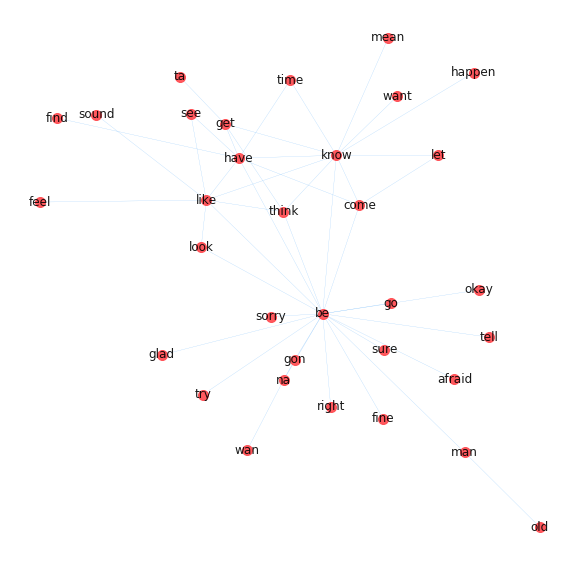

In [52]:
#SCIFI MOVIES
layout = nx.spring_layout(giant_sfi, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant_sfi, ax = ax, pos = layout, labels = {n:n for n in giant_sfi.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

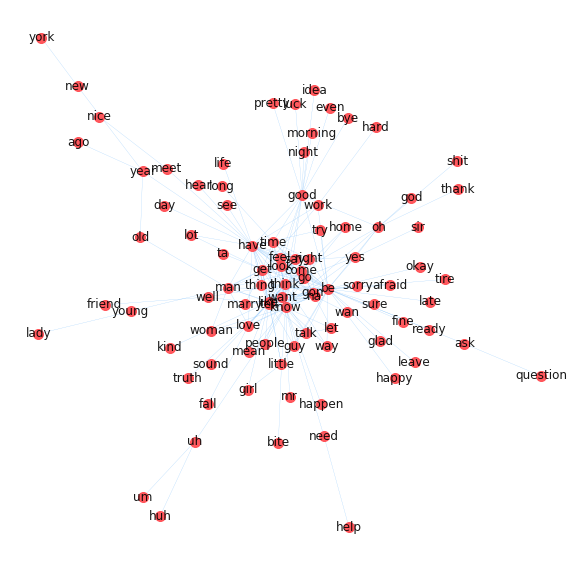

In [101]:
#ROMANCE MOVIES
layout = nx.spring_layout(giant_r, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant_r, ax = ax, pos = layout, labels = {n:n for n in giant_r.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

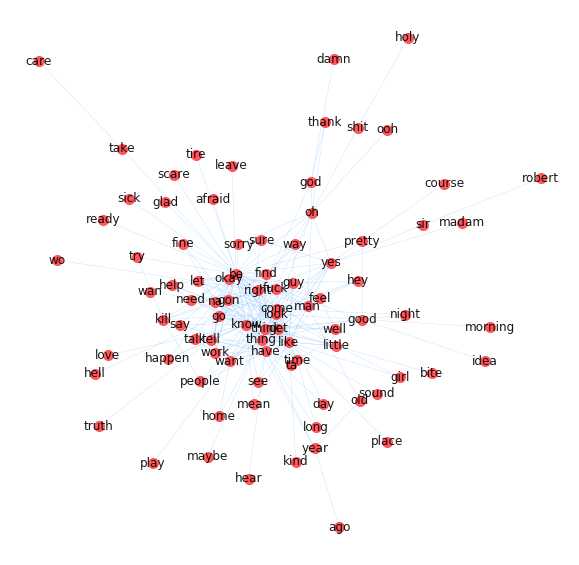

In [65]:
#HORROR MOVIES
layout = nx.spring_layout(giant_h, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant_h, ax = ax, pos = layout, labels = {n:n for n in giant_h.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

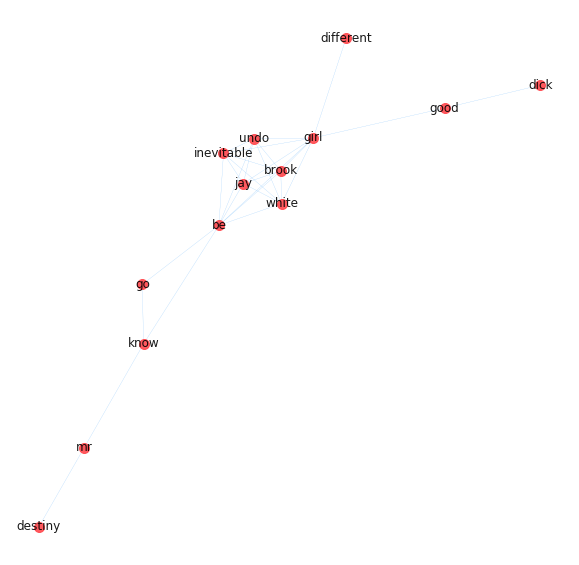

In [54]:
#JUST ROMANCE HEADINGS
layout = nx.spring_layout(giant_rt, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant_rt, ax = ax, pos = layout, labels = {n:n for n in giant_rt.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

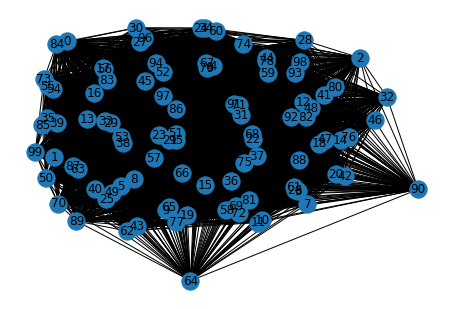

In [100]:
layout_rom = nx.spring_layout(gDoc_rom, k = 1/3, weight='weight', iterations= 50)
nx.draw(gDoc_rom, pos = layout_rom, labels = {n:n for n in gDoc_rom.nodes()}) #Getting labels is a bit annoying

## <span style="color:red">*Exercise 2*</span>

<span style="color:red">Construct cells immediately below this that calculate different kinds of centrality for distinct words or documents in a network composed from your corpus of interest. Which type of words tend to be most and least central? Can you identify how different centrality measures distinguish different kind of words in your corpus? What do these patterns suggest about the semantic content and structure of your documents? Finally, calculate global measure for your network(s) and discuss what they reveal.

# EXERCISE 2

Just using the 5 scripts in each category is not helpful for centrality analysis so I then used all the movies within each genre. 

In [241]:
dcentralities_rom5 = nx.degree_centrality(giant_rom5)

In [242]:
dcentralities_com5 = nx.degree_centrality(giant_com5)

In [243]:
dcentralities_dra5 = nx.degree_centrality(giant_dra5)

In [244]:
dcentralities_mix5 = nx.degree_centrality(giant_mix5)

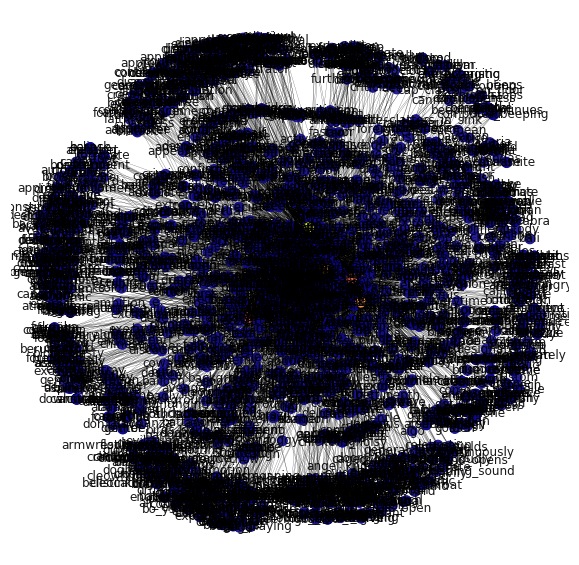

In [245]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(dcentralities_rom5.items(), key = lambda x : x[1])[1]
nx.draw(giant_rom5, ax = ax, pos = layout, labels = {n:n for n in giant_rom5.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = [dcentralities_rom5[n] / maxC for n in giant_rom5.nodes],
        cmap = plt.get_cmap('plasma'))

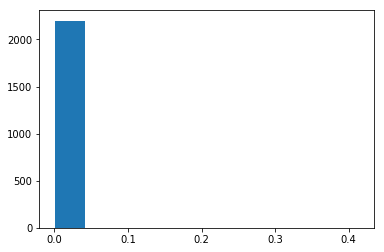

In [246]:
plt.hist(list(dcentralities_rom5.values()))
plt.show()

In [250]:
sorted(dcentralities_rom5.items(), key = lambda x: x[1], reverse = True)[7:17]

[('affection', 0.0022696323195642307),
 ('airline', 0.0022696323195642307),
 ('alarm_ringing', 0.0022696323195642307),
 ('allagreeing', 0.0022696323195642307),
 ('amigo', 0.0022696323195642307),
 ('antiquarian', 0.0022696323195642307),
 ('appointee', 0.0022696323195642307),
 ('argue', 0.0022696323195642307),
 ('awake', 0.0022696323195642307),
 ('beauty', 0.0022696323195642307)]

In [254]:
sorted(dcentralities_com5.items(), key = lambda x: x[1], reverse = True)[:17]

[(3, 0.5166846071044133),
 (4, 0.32651596698959456),
 (1, 0.2673125224255472),
 (0, 0.1898098313598852),
 (2, 0.1532113383566559),
 ('3:10pm', 0.001794043774668102),
 ('allscreaminginjoy', 0.001794043774668102),
 ('angel_clare', 0.001794043774668102),
 ('appeal', 0.001794043774668102),
 ('asker', 0.001794043774668102),
 ('assistant', 0.001794043774668102),
 ('bentley', 0.001794043774668102),
 ('body', 0.001794043774668102),
 ('brendas', 0.001794043774668102),
 ('brokeback', 0.001794043774668102),
 ('bunt', 0.001794043774668102),
 ('chill', 0.001794043774668102)]

In [255]:
sorted(dcentralities_dra5.items(), key = lambda x: x[1], reverse = True)[:17]

[(0, 0.46640903686087987),
 (1, 0.40219976218787157),
 (2, 0.28151010701545776),
 (4, 0.18579072532699167),
 (3, 0.13049940546967895),
 ('19th', 0.0014863258026159333),
 ('amatu', 0.0014863258026159333),
 ('approach', 0.0014863258026159333),
 ('babysitter', 0.0014863258026159333),
 ('beeping_stops', 0.0014863258026159333),
 ('behave', 0.0014863258026159333),
 ('bowl', 0.0014863258026159333),
 ('caretaker', 0.0014863258026159333),
 ('clara', 0.0014863258026159333),
 ('contractor', 0.0014863258026159333),
 ('core', 0.0014863258026159333),
 ('corndog', 0.0014863258026159333)]

In [256]:
sorted(dcentralities_mix5.items(), key = lambda x: x[1], reverse = True)[:17]

[(10, 0.272206800832755),
 (8, 0.2498265093684941),
 (11, 0.23473282442748092),
 (12, 0.16429562803608605),
 (4, 0.15822345593337958),
 (9, 0.1578764746703678),
 (6, 0.1292505204718945),
 (2, 0.1290770298403886),
 (1, 0.12092297015961137),
 (14, 0.10843164469118667),
 (3, 0.10062456627342123),
 (5, 0.0917765440666204),
 (0, 0.08691880638445523),
 (13, 0.07616238723108952),
 (7, 0.07408049965301873),
 ('be', 0.00260235947258848),
 ('come', 0.00260235947258848)]

In [60]:
def filterWords(G, minWeight = 3, filter_ = "betweenness", rule = "number", value_of_rule = 200):
    """Function to filter network by degree centrality measures"""
    G = G.copy()
    try:
        G.remove_edges_from([(n1,n2) for n1, n2, d in G.edges(data = True) if d['weight'] < minWeight])
    except:
        print("weight might be missing from one or more edges")
        raise
    if filter_ =="betweenness":
        index = nx.betweenness_centrality(G) #betweeness centrality score
    elif filter_ == "closeness":
        index = nx.closeness_centrality(G) #closeness centrality score
    elif filter_ == "eigenvector":
        index = nx.eigenvector_centrality(G) #eigenvector centrality score
    elif filter_ == "degree":
        index = nx.degree_centrality(G) #degree centrality score
    else:
        raise ValueError("wrong filter paremeter, should be: betweenness/closeness/eigenvector")    
        
    if rule=='number':# if filter by limiting the total number of nodes 
        
        sorted_index = sorted(index.items(), key=lambda x:x[1], reverse=True)
        value_of_rule = np.min([value_of_rule, len(G.nodes)])
        
        nodes_remain = {}
        for word, centr in sorted_index[:value_of_rule]:
            nodes_remain[word] = centr
        G.remove_nodes_from([n for n in index if n not in nodes_remain])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G
    
    if rule=='above':# if filter by limiting the min value of centrality
        value_of_rule = np.max([float(value_of_rule),0])
        G.remove_nodes_from([n for n in index if index[n] >=value_of_rule])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G
    
    if rule=='below':# if filter by limiting the max value of centrality
        value_of_rule = np.max([float(value_of_rule),0])
        G.remove_nodes_from([n for n in index if index[n] <=value_of_rule])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G

# Filtered Movie Genre Centrality

In [305]:
giant_rom_filtered30 = filterWords(giant_rom, minWeight=3, filter_='betweenness', rule='number', value_of_rule=25)
#print(nx.info(giant_rom_filtered30))

Total number of nodes(after filtering) in the graph is 25


In [313]:
giant_sf_filtered30 = filterWords(giant_scifi, minWeight=3, filter_='betweenness', rule='number', value_of_rule=25)
#print(nx.info(giant_rom_filtered30))

Total number of nodes(after filtering) in the graph is 25


In [95]:
giant_h_filtered30 = filterWords(giant_h, minWeight=3, filter_='betweenness', rule='number', value_of_rule=25)
#print(nx.info(giant_rom_filtered30))

Total number of nodes(after filtering) in the graph is 25


## HORROR 
The nodes have some swear words and exclamations

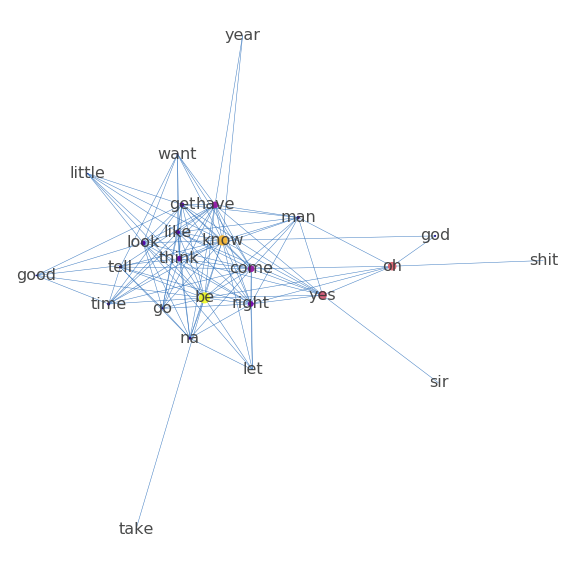

In [96]:
layout_giant_h_filtered30 = nx.spring_layout(giant_h_filtered30, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_h_giant30 = nx.betweenness_centrality(giant_h_filtered30)
maxC = max(centralities_h_giant30.items(), key = lambda x : x[1])[1]
nx.draw(giant_h_filtered30, ax = ax, pos = layout_giant_h_filtered30, labels = {n: n for n in giant_h_filtered30.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_h_giant30[n] / maxC for n in giant_h_filtered30.nodes],
        node_size = [centralities_h_giant30[n] / maxC * 100 for n in giant_h_filtered30.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

## ROMANCE
The nodes have words like love and hate

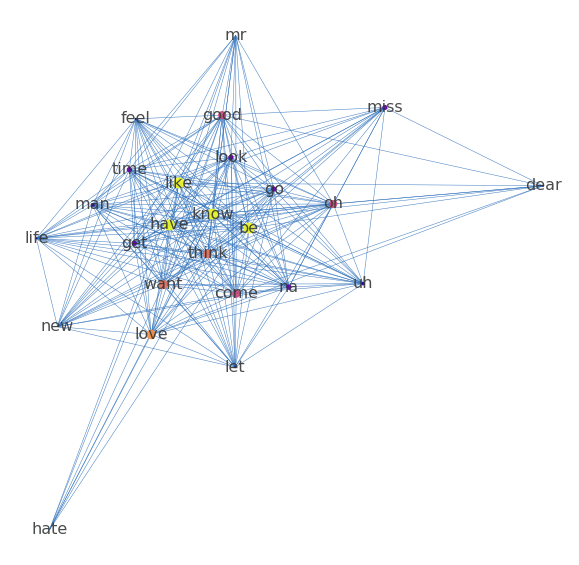

In [306]:
layout_giant_rom_filtered30 = nx.spring_layout(giant_rom_filtered30, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_rom_giant30 = nx.betweenness_centrality(giant_rom_filtered30)
maxC = max(centralities_rom_giant30.items(), key = lambda x : x[1])[1]
nx.draw(giant_rom_filtered30, ax = ax, pos = layout_giant_rom_filtered30, labels = {n: n for n in giant_rom_filtered30.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_rom_giant30[n] / maxC for n in giant_rom_filtered30.nodes],
        node_size = [centralities_rom_giant30[n] / maxC * 100 for n in giant_rom_filtered30.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

## SCI-FI
The sci-fi words don't seem as easily recognizable

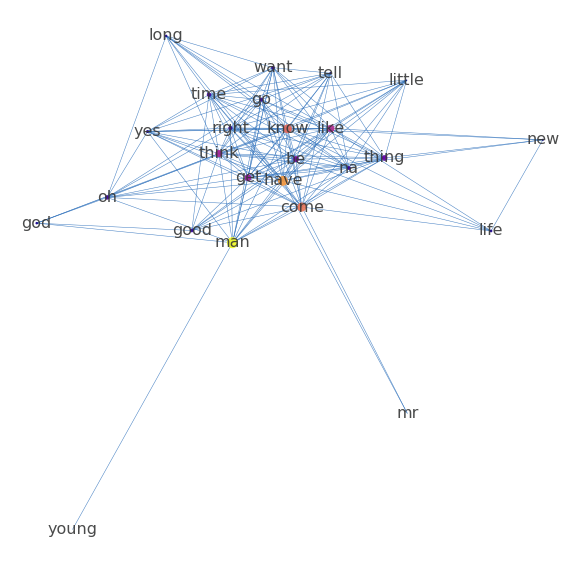

In [314]:
layout_giant_sf_filtered30 = nx.spring_layout(giant_sf_filtered30, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_sf_giant30 = nx.betweenness_centrality(giant_sf_filtered30)
maxC = max(centralities_sf_giant30.items(), key = lambda x : x[1])[1]
nx.draw(giant_sf_filtered30, ax = ax, pos = layout_giant_sf_filtered30, labels = {n: n for n in giant_sf_filtered30.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_sf_giant30[n] / maxC for n in giant_sf_filtered30.nodes],
        node_size = [centralities_sf_giant30[n] / maxC * 100 for n in giant_sf_filtered30.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

In [253]:
dcentralities_rom = nx.degree_centrality(giant_rom)

In [251]:
centralities_rom5 = nx.betweenness.betweenness_centrality(giant_rom5)

In [259]:
sorted(dcentralities_rom.items(), key = lambda x: x[1], reverse = True)[13:20]

[('man', 0.13178294573643412),
 ('love', 0.12093023255813953),
 ('right', 0.1186046511627907),
 ('say', 0.11162790697674418),
 ('good', 0.11007751937984496),
 ('let', 0.10852713178294573),
 ('thing', 0.10775193798449612)]

In [277]:
sorted(dcentralities_rom.items(), key = lambda x: x[1], reverse = True)[:20]

[('be', 0.3263565891472868),
 ('know', 0.28604651162790695),
 ('like', 0.2813953488372093),
 ('have', 0.24651162790697673),
 ('get', 0.2434108527131783),
 ('think', 0.22093023255813954),
 ('want', 0.20310077519379843),
 ('come', 0.1930232558139535),
 ('go', 0.17054263565891473),
 ('na', 0.14418604651162792),
 ('time', 0.14031007751937985),
 ('tell', 0.13333333333333333),
 ('look', 0.13333333333333333),
 ('man', 0.13178294573643412),
 ('love', 0.12093023255813953),
 ('right', 0.1186046511627907),
 ('say', 0.11162790697674418),
 ('good', 0.11007751937984496),
 ('let', 0.10852713178294573),
 ('thing', 0.10775193798449612)]

In [278]:
sorted(dcentralities_scifi.items(), key = lambda x: x[1], reverse = True)[:20]

[('be', 0.31399317406143346),
 ('know', 0.2491467576791809),
 ('get', 0.24232081911262798),
 ('like', 0.2286689419795222),
 ('have', 0.2286689419795222),
 ('think', 0.20136518771331058),
 ('na', 0.16723549488054607),
 ('come', 0.16382252559726962),
 ('go', 0.15017064846416384),
 ('want', 0.14334470989761092),
 ('time', 0.14334470989761092),
 ('right', 0.13651877133105803),
 ('man', 0.13651877133105803),
 ('thing', 0.13310580204778158),
 ('gon', 0.13310580204778158),
 ('look', 0.11945392491467577),
 ('tell', 0.10921501706484642),
 ('let', 0.09897610921501707),
 ('good', 0.09215017064846416),
 ('yes', 0.08873720136518772)]

In [117]:
dcentralities_love = nx.degree_centrality(g_love)

In [118]:
sorted(dcentralities_love.items(), key = lambda x: x[1], reverse = True)[:20]

[('love', 1.25),
 ('know', 1.125),
 ('have', 1.0),
 ('like', 1.0),
 ('be', 1.0),
 ('think', 0.875),
 ('man', 0.75),
 ('woman', 0.375),
 ('fall', 0.125)]

In [121]:
#ROMANCE
g_rom = wordCooccurrence(movie_romance['normalized_sents'][:100].sum())

senVectorizer = sklearn.feature_extraction.text.CountVectorizer(tokenizer = tokenize)
senVects_incidence_rom = senVectorizer.fit_transform(movie_romance['Text'][:100])

g_2mode_rom = nx.Graph()

#define all the nodes
g_2mode_rom.add_nodes_from((senVectorizer.get_feature_names()[i] for i in range(senVects_incidence_rom.shape[1])), bipartite = 'word')
g_2mode_rom.add_nodes_from(range(senVects_incidence_rom.shape[0]), bipartite = 'doc')

#add all the edges
g_2mode_rom.add_edges_from(((d, senVectorizer.get_feature_names()[w], {'weight' : senVects_incidence_rom[d, w]}) for d, w in zip(*senVects_incidence_rom.nonzero())))

In [266]:
#SCIFI
g_scifi = wordCooccurrence(movie_scifi['normalized_sents'][:100].sum())

senVectorizer = sklearn.feature_extraction.text.CountVectorizer(tokenizer = tokenize)
senVects_incidence_scifi = senVectorizer.fit_transform(movie_scifi['Text'][:100])

g_2mode_scifi = nx.Graph()

#define all the nodes
g_2mode_scifi.add_nodes_from((senVectorizer.get_feature_names()[i] for i in range(senVects_incidence_scifi.shape[1])), bipartite = 'word')
g_2mode_scifi.add_nodes_from(range(senVects_incidence_scifi.shape[0]), bipartite = 'doc')

#add all the edges
g_2mode_scifi.add_edges_from(((d, senVectorizer.get_feature_names()[w], {'weight' : senVects_incidence_scifi[d, w]}) for d, w in zip(*senVects_incidence_scifi.nonzero())))

In [96]:
print(nx.info(g_2mode_rom))

Name: 
Type: Graph
Number of nodes: 18149
Number of edges: 97315
Average degree:  10.7240


In [122]:
def contractNetwork_rom(g, targetType):
    g_mono = nx.Graph()
    g_mono.add_nodes_from(((n, d) for n, d in g_2mode_rom.nodes(data = True) if d['bipartite'] == targetType))
    
    for n_outside in (n for n, d in g_2mode_rom.nodes(data = True) if d['bipartite'] != targetType):
        neighbors = list((n for n in g.neighbors(n_outside) if g.nodes[n]['bipartite'] == targetType))
        for i, n1 in enumerate(neighbors):
            for n2 in neighbors[i+1:]:
                try:
                    g_mono.edges[n1, n2]['weight'] += 1
                except KeyError:
                    g_mono.add_edge(n1, n2, weight = 1)
    return g_mono

In [267]:
def contractNetwork_sf(g, targetType):
    g_mono = nx.Graph()
    g_mono.add_nodes_from(((n, d) for n, d in g_2mode_scifi.nodes(data = True) if d['bipartite'] == targetType))
    
    for n_outside in (n for n, d in g_2mode_scifi.nodes(data = True) if d['bipartite'] != targetType):
        neighbors = list((n for n in g.neighbors(n_outside) if g.nodes[n]['bipartite'] == targetType))
        for i, n1 in enumerate(neighbors):
            for n2 in neighbors[i+1:]:
                try:
                    g_mono.edges[n1, n2]['weight'] += 1
                except KeyError:
                    g_mono.add_edge(n1, n2, weight = 1)
    return g_mono

In [123]:
gDoc_rom = contractNetwork_rom(g_2mode_rom, 'doc')

In [268]:
gDoc_scifi = contractNetwork_sf(g_2mode_scifi, 'doc')

In [99]:
print(nx.info(gDoc_rom))

Name: 
Type: Graph
Number of nodes: 100
Number of edges: 4950
Average degree:  99.0000


In [269]:
layout_scifi = nx.spring_layout(gDoc_scifi, k = 1/3, weight='weight', iterations= 50)
#nx.draw(gDoc_scifi, pos = layout_scifi, labels = {n:n for n in gDoc_scifi.nodes()}) #Getting labels is a bit annoying

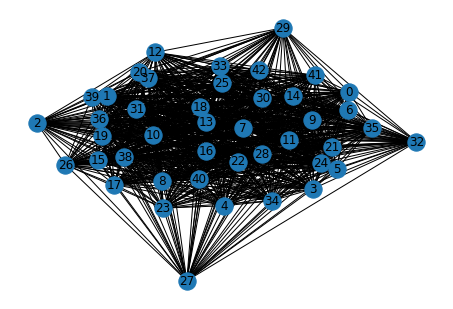

In [276]:
nx.draw(gDoc_scifi, pos = layout_scifi, labels = {n:n for n in gDoc_scifi.nodes()})

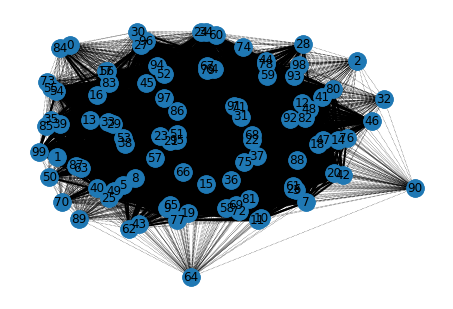

In [101]:

wMedian_rom = np.median([d['weight'] for n1, n2, d in gDoc_rom.edges(data = True)])
edgesHigh_rom = [(n1, n2) for n1, n2, d in gDoc_rom.edges(data = True) if d['weight'] > wMedian_rom]
edgesLow_rom = [(n1, n2) for n1, n2, d in gDoc_rom.edges(data = True) if d['weight'] <= wMedian_rom]
#nx.draw(gDoc_rom, pos = layout_rom, labels = {n:n for n in gDoc_rom.nodes()}, edgelist = edgesLow_rom, style='dotted', width=.5)
#nx.draw(gDoc_rom, pos = layout_rom, nodelist=None, edgelist = edgesHigh_rom, width=2)

In [102]:

print(len(movie_romance.iloc[90]['Text']),"words:","\n",movie_romance.iloc[90]['Text'].strip().replace('  ', '\n'))

9641 words: 
 @5840452 And her ambition was to extend her realm ... to all the regions of the known world . To this end , she gathered an army . And she bore a son and named him Nekron . And him she tutored in the black arts and in the powers of the mind . And when Nekron came of age ... and attained mastery of those powers ... together they seized control of the region of Ice . And from their castle called Ice Peak ... they sent a giant glacier rumbling southward . No village or people could stand against its relentless onslaught . And so the remnants of humanity fled south ... and huddled for warmth among the volcanoes ... of a mountain region ruled by a generous king named Jarol ... from his fortress , which men called Fire Keep . And still Nekron pushed the Ice ever southward ... into the temperate zone toward Fire Keep . And no one dared guess at the outcome ... of a meeting on the field of battle ... between Fire and Ice . Hold your positions , men . Steady . Lam , it can not be 

In [107]:
movie_romance.iloc[90]

Movie Name                                               Fire and Ice
Genre                                           Short, Drama, Romance
Year                                                             2010
Country                                                       English
Text                @5840452 And her ambition was to extend her re...
tokenized_sents     [[@5840452, And, her, ambition, was, to, exten...
normalized_sents    [[@5840452, ambition, extend, realm, region, k...
Name: 5840452, dtype: object

In [103]:
#MYCODE
print(len(movie_romance.iloc[64]['Text']),"words:","\n",movie_romance.iloc[64]['Text'].strip().replace('  ', '\n'))

7084 words: 
 @4735269 COWARDS BEND THE KNEE or THE BLUE HANDS Chapter One SPERM PLAYERS GUY MADDIN Rover with the Winnipeg Maroons MO MOTT His best friend SHAKY Maroons Captain and Police Captain Guy's first headknock of the night Shaky's vengeance MADDIN SR . Voice of the Maroons Guy's second headknock his girfriend , VERONICA . In trouble ... DR . FUSI Team physician ... Patches up Guy's beleaguered head . THE ALLAN CUP ! " Be sure to visit the hospital . " " Your mother asks for you . " " Your mother . " " I promise . " Waiting ... Delirious from his two knocknocks Guy tries to remember his mother , his dying mother while forces beyond his control conspire to shunt him off onto a depressing detour . End of CHAPTER ONE Chapter Two A SQUEEZE OF THE HAND Fusi , Shaky Guy take Veronica to the ... NIGHT CLINIC The Glum Couple TWO LONG , TWO SHORT . THE BLACK SILHOUETTE SALON Beauty salon by day ... Bordello by night . A piece of warm pie ... The calling card of ... LILIOM Proprietress a

In [106]:
movie_romance.iloc[64]

Movie Name                                      Cowards Bend the Knee
Genre                                                  Drama, Romance
Year                                                             2003
Country                                                       English
Text                @4735269 COWARDS BEND THE KNEE or THE BLUE HAN...
tokenized_sents     [[@4735269, COWARDS, BEND, THE, KNEE, or, THE,...
normalized_sents    [[@4735269, coward, bend, knee, blue], [hand, ...
Name: 4735269, dtype: object

In [104]:

print(len(movie_romance.iloc[86]['Text']),"words:","\n",movie_romance.iloc[86]['Text'].strip().replace('  ', '\n'))

63627 words: 
 @4006462 # Christmastime is almost here again # # People come from far and near again # # Isn't Christmastime a wonderful thing # # Deck the halls and hang the mistletoe # # Kiss the one you love and let ' em know # # Isn't Christmastime a wonderful thing # There are three things that all New Yorkers strive for : the perfect job , the perfect apartment , and the perfect fiance : How did I , E : J : Baxter , manage to pull off that trifecta ? Because I never took " no " for an answer : even if it made me miserable : J : , it's Susan Curtsonis : Look , I really appreciate your interest ... but we're perfectly happy with the public relations company we have . Have a happy holiday . Susan Curtsonis's office : I'm sorry , but she's not here . Actually , I wasn't calling to pitch her account . I was calling you , Cindy . - Despite the outcome , you have been a real class act . - Thank you . If I can @ @ @ @ @ @ @ @ @ @ , but I've got to go spend my lunch hour ... standing in l

In [105]:
movie_romance.iloc[86]

Movie Name                                        12 Men of Christmas
Genre                                                 Comedy, Romance
Year                                                             2009
Country                                                       English
Text                @4006462 # Christmastime is almost here again ...
tokenized_sents     [[@4006462, Christmastime, is, almost, here, a...
normalized_sents    [[@4006462, christmastime, people, come, far, ...
Name: 4006462, dtype: object

In [124]:

gWord_rom = contractNetwork_rom(g_2mode_rom, 'word')
#print(nx.info(gWord_rom))

In [296]:

gWord_scifi = contractNetwork_sf(g_2mode_scifi, 'word')
print(nx.info(gWord_scifi))

Name: 
Type: Graph
Number of nodes: 9771
Number of edges: 9383991
Average degree: 1920.7842


In [125]:

wMean_rom = np.mean([d['weight'] for n1, n2, d in gWord_rom.edges(data = True)])
wMean_rom

2.229358586978459

In [126]:
def connected_component_subgraphs(G):
    for c in nx.connected_components(G):
        yield G.subgraph(c)

In [127]:
#MYCODE
g_rom.remove_edges_from([(n1, n2) for n1, n2, d in g_rom.edges(data = True) if d['weight'] <= 5])
g_rom.remove_nodes_from(list(nx.isolates(g_rom))) 
giant_rom = max(connected_component_subgraphs(g_rom), key=len) 
print(nx.info(giant_rom))

Name: 
Type: Graph
Number of nodes: 1291
Number of edges: 7821
Average degree:  12.1162


In [297]:
g_scifi = wordCooccurrence(movie_scifi['normalized_sents'][:100].sum())

In [298]:

g_scifi.remove_edges_from([(n1, n2) for n1, n2, d in g_scifi.edges(data = True) if d['weight'] <= 5])
g_scifi.remove_nodes_from(list(nx.isolates(g_scifi))) 
giant_scifi = max(connected_component_subgraphs(g_scifi), key=len) 
print(nx.info(giant_scifi))

Name: 
Type: Graph
Number of nodes: 294
Number of edges: 1049
Average degree:   7.1361


In [301]:
dcentralities_scifi = nx.degree_centrality(giant_scifi)

In [302]:
sorted(dcentralities_scifi.items(), key = lambda x: x[1], reverse = True)[:20]

[('be', 0.31399317406143346),
 ('know', 0.2491467576791809),
 ('get', 0.24232081911262798),
 ('like', 0.2286689419795222),
 ('have', 0.2286689419795222),
 ('think', 0.20136518771331058),
 ('na', 0.16723549488054607),
 ('come', 0.16382252559726962),
 ('go', 0.15017064846416384),
 ('want', 0.14334470989761092),
 ('time', 0.14334470989761092),
 ('right', 0.13651877133105803),
 ('man', 0.13651877133105803),
 ('thing', 0.13310580204778158),
 ('gon', 0.13310580204778158),
 ('look', 0.11945392491467577),
 ('tell', 0.10921501706484642),
 ('let', 0.09897610921501707),
 ('good', 0.09215017064846416),
 ('yes', 0.08873720136518772)]

In [280]:
ecentralities_rom = nx.eigenvector_centrality(giant_rom)

In [304]:
sorted(dcentralities_rom.items(), key = lambda x: x[1], reverse = True)[:20]

[('be', 0.3263565891472868),
 ('know', 0.28604651162790695),
 ('like', 0.2813953488372093),
 ('have', 0.24651162790697673),
 ('get', 0.2434108527131783),
 ('think', 0.22093023255813954),
 ('want', 0.20310077519379843),
 ('come', 0.1930232558139535),
 ('go', 0.17054263565891473),
 ('na', 0.14418604651162792),
 ('time', 0.14031007751937985),
 ('tell', 0.13333333333333333),
 ('look', 0.13333333333333333),
 ('man', 0.13178294573643412),
 ('love', 0.12093023255813953),
 ('right', 0.1186046511627907),
 ('say', 0.11162790697674418),
 ('good', 0.11007751937984496),
 ('let', 0.10852713178294573),
 ('thing', 0.10775193798449612)]

In [133]:
def graph_components(graph):
    # The graph may contain multiple components, but we can only handle one connected component. If the graph contains
    # more than one connected component, we only use the largest one.
    components = list(connected_component_subgraphs(graph))
    components.sort(key=lambda c: c.size(), reverse=True)
 
    return components

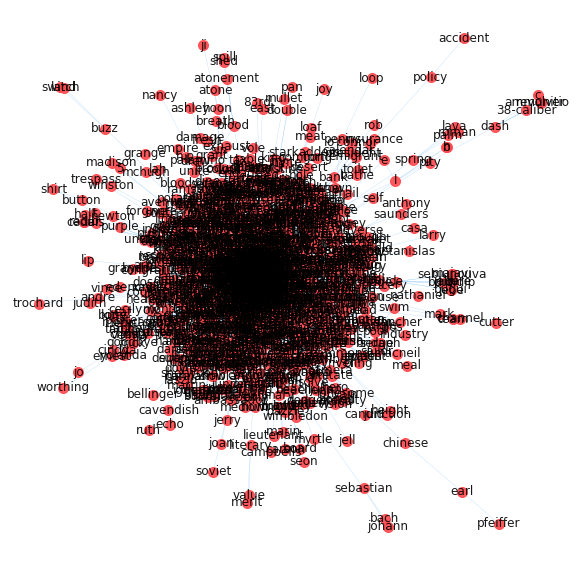

In [134]:
layout_rom = nx.spring_layout(giant_rom, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant_rom, ax = ax, pos = layout_rom, labels = {n:n for n in giant_rom.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') #Getting labels is a bit annoying

In [261]:
#MYCODE
nx.clique.number_of_cliques(giant_rom5)['affection']

5

In [143]:
print(', '.join(max(nx.clique.find_cliques(giant_rom), key = lambda x: len(x))))

be, know, like, have, think, get, want, go, come, time, na, well, look, right, tell, say, let, man, life, thing, find, oh, feel, love, year, yes, old, mean, little, good


In [272]:
print(', '.join(max(nx.clique.find_cliques(giant_scifi), key = lambda x: len(x))))

want, like, know, have, think, get, come, right, look, thing, man, na, gon


## FINDING NEIGHBOURS FOR SPECIFIC WORDS - LOVE

In [128]:
#MYCODE
loveNeighbors = giant_rom.neighbors('love')
g_love = giant_rom.subgraph(loveNeighbors)
print(nx.info(g_love))

Name: 
Type: Graph
Number of nodes: 155
Number of edges: 2798
Average degree:  36.1032


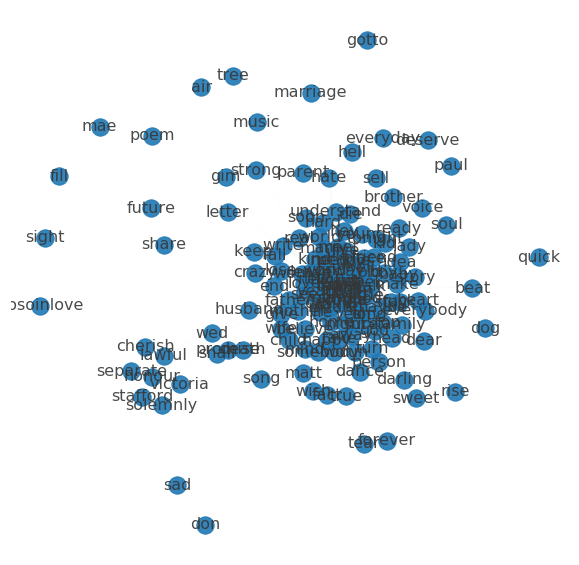

In [129]:
layout_love = nx.spring_layout(g_love, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
maxWeight = max((d['weight'] for n1, n2, d in g_love.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in g_love.edges(data = True)))
nx.draw(g_love, ax = ax, pos = layout_love, labels = {n:n for n in g_love.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in g_love.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:sky blue',
        cmap = plt.get_cmap('plasma'))

# Network Statistics
We can often gain more insight into our semantic network through statistics that describe the positions of words within it.

We begin with measures of centrality. The concept of centrality is that some nodes (words or documents) are more *central* to the network than others. The most straightforward is the notion of degree centrality: those nodes that have the highest number of connections are the most central. Here our measure normalizes the number of connections by those with the most connections.

In [ ]:
dcentralities = nx.degree_centrality(giant)

In [114]:
dcentralities['american']

0.038216560509554146

In [115]:
max(dcentralities.items(), key = lambda x : x[1])

('health', 0.43312101910828027)

We can color and size the nodes by betweenness centrality, it's much faster to redraw since we aren't redoing the layout.

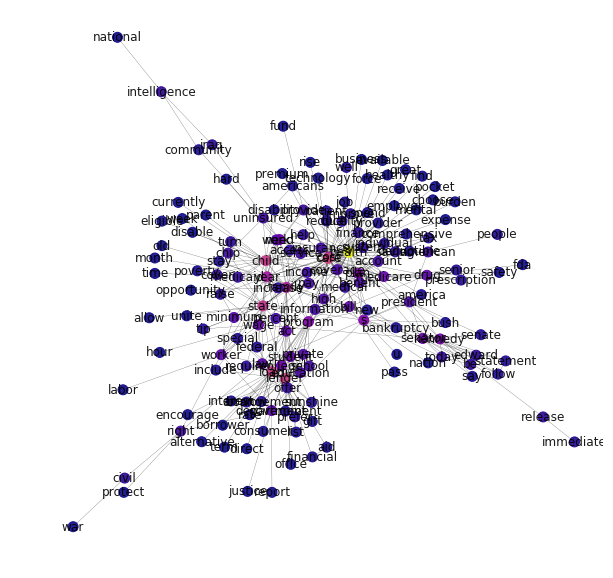

In [116]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(dcentralities.items(), key = lambda x : x[1])[1]
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = [dcentralities[n] / maxC for n in giant.nodes],
        cmap = plt.get_cmap('plasma')) 

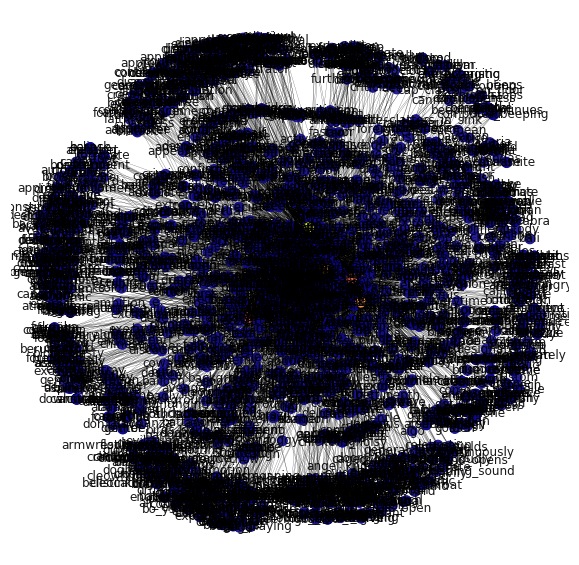

In [286]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(dcentralities_rom5.items(), key = lambda x : x[1])[1]
nx.draw(giant_rom5, ax = ax, pos = layout, labels = {n:n for n in giant_rom5.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = [dcentralities_rom5[n] / maxC for n in giant_rom5.nodes],
        cmap = plt.get_cmap('plasma')) 

Another way to visualize the graph involes the use of size to represent degree centrality and edge weight:

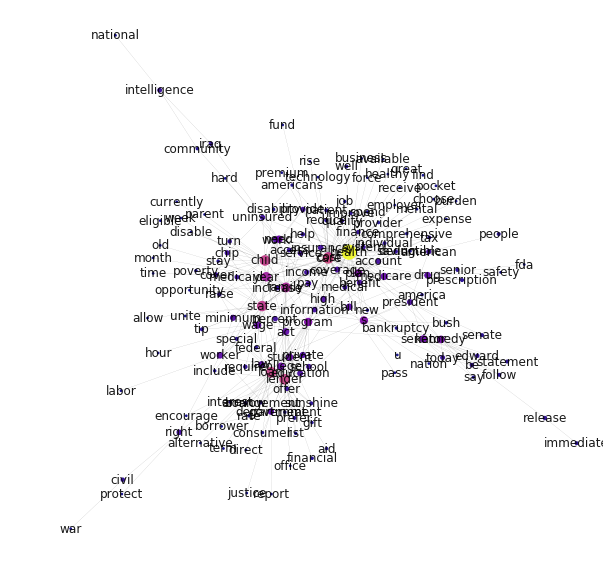

In [117]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(dcentralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant.edges(data = True)))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gWord.edges(data = True)], 
        alpha = .9, 
        node_color = [dcentralities[n] / maxC for n in giant.nodes],
        node_size = [dcentralities[n] / maxC * 200 for n in giant.nodes],
        cmap = plt.get_cmap('plasma')) 

The distrubution of degree centrality is:

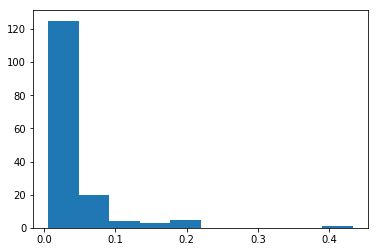

In [118]:
plt.hist(list(dcentralities.values()))
plt.show()

What are the top and bottom ten words in terms of degree?

In [119]:
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('health', 0.43312101910828027),
 ('care', 0.21656050955414013),
 ('lender', 0.20382165605095542),
 ('loan', 0.20382165605095542),
 ('child', 0.19745222929936307),
 ('state', 0.1910828025477707),
 ('family', 0.1656050955414013),
 ('cost', 0.15923566878980894),
 ('year', 0.15286624203821658),
 ('s', 0.11464968152866242)]

In [120]:
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('currently', 0.006369426751592357),
 ('find', 0.006369426751592357),
 ('rise', 0.006369426751592357),
 ('available', 0.006369426751592357),
 ('technology', 0.006369426751592357),
 ('alternative', 0.006369426751592357),
 ('parent', 0.006369426751592357),
 ('old', 0.006369426751592357),
 ('premium', 0.006369426751592357),
 ('unite', 0.006369426751592357)]

Consider another very different measure, which is *betweenness* centrality. Betweenness centrality distinguishes nodes that require the most shortest pathways between all other nodes in the network. Semantically, words with a high betweenness centrality may link distinctive domains, rather than being "central" to any one. In other words, high *betweenness centrality* nodes may not have the highest *degree centrality*.

In [121]:
centralities = nx.betweenness.betweenness_centrality(giant)

In [122]:
centralities['american']

0.012738853503184714

In [123]:
max(centralities.items(), key = lambda x : x[1])

('health', 0.42036210248253636)

We can color and size the nodes by betweenness centrality:

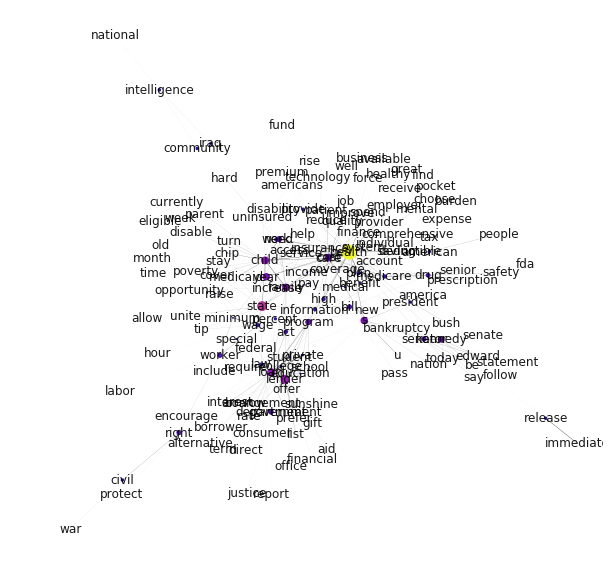

In [125]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(centralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant.edges(data = True)))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in giant.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities[n] / maxC for n in giant.nodes],
        node_size = [centralities[n] / maxC * 200 for n in giant.nodes],
        cmap = plt.get_cmap('plasma')) 

The distrubution of betweenness centrality is:

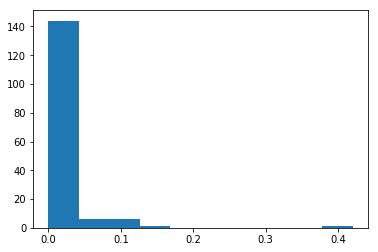

In [126]:
plt.hist(list(centralities.values()))
plt.show()

This is an exponential distrubution, but you might need to add more nodes to see it clearly.

What are the top ten words in terms of betweenness?

In [127]:
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('health', 0.43312101910828027),
 ('care', 0.21656050955414013),
 ('lender', 0.20382165605095542),
 ('loan', 0.20382165605095542),
 ('child', 0.19745222929936307),
 ('state', 0.1910828025477707),
 ('family', 0.1656050955414013),
 ('cost', 0.15923566878980894),
 ('year', 0.15286624203821658),
 ('s', 0.11464968152866242)]

What are words lower down?

In [128]:
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[50:60]

[('access', 0.03184713375796178),
 ('increase', 0.03184713375796178),
 ('medical', 0.03184713375796178),
 ('medicaid', 0.03184713375796178),
 ('offer', 0.03184713375796178),
 ('edward', 0.025477707006369428),
 ('release', 0.025477707006369428),
 ('help', 0.025477707006369428),
 ('raise', 0.025477707006369428),
 ('turn', 0.025477707006369428)]

We can also look at closeness centrality, or the average Euclidean or path distance between a node and all others in the network. A node with the highest closeness centrality is most likely to send a signal with the most coverage to the rest of the network.

In [71]:
centralities = nx.closeness_centrality(giant)

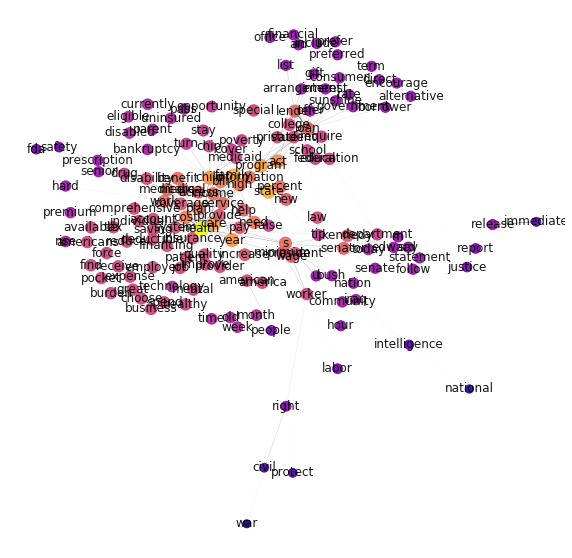

In [72]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(centralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant.edges(data = True)))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in giant.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities[n] / maxC for n in giant.nodes],
        node_size = [centralities[n] / maxC * 200 for n in giant.nodes],
        cmap = plt.get_cmap('plasma')) 

Top and bottom:

In [73]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('health', 0.5464285714285714),
 ('family', 0.4811320754716981),
 ('state', 0.478125),
 ('care', 0.4636363636363636),
 ('program', 0.4622356495468278),
 ('child', 0.4540059347181009),
 ('year', 0.4526627218934911),
 ('act', 0.4421965317919075),
 ('cost', 0.4297752808988764),
 ('bill', 0.4214876033057851)]

In [74]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('report', 0.255),
 ('justice', 0.255),
 ('fda', 0.2528925619834711),
 ('safety', 0.2528925619834711),
 ('intelligence', 0.2311178247734139),
 ('immediate', 0.2191977077363897),
 ('civil', 0.20930232558139536),
 ('protect', 0.208731241473397),
 ('national', 0.18796068796068796),
 ('war', 0.17327293318233294)]

Or eignvector centrality, an approach that weights degree by the centrality of those to whom one is tied (and the degree to whom they are tied, etc.) In short, its an $n$th order degree measure.

In [75]:
centralities = nx.eigenvector_centrality(giant)

In [82]:
centralities = nx.eigenvector_centrality(giant_h)

In [83]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('be', 0.3238601514576315),
 ('know', 0.29314311570696655),
 ('like', 0.26062567914861196),
 ('have', 0.25910729315538367),
 ('right', 0.23893222621973975),
 ('get', 0.233583715586362),
 ('think', 0.23260417452456736),
 ('na', 0.23023897229527074),
 ('come', 0.22383906280275379),
 ('gon', 0.20672188331717523)]

In [84]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('thank', 0.006300113874606496),
 ('ooh', 0.005233554241445603),
 ('idea', 0.005179375804794601),
 ('morning', 0.005179375804794601),
 ('shit', 0.004936955692386765),
 ('ago', 0.002041682427437788),
 ('damn', 0.001380983504414416),
 ('care', 0.0011728454853301038),
 ('robert', 0.0005507249977547314),
 ('holy', 0.0002965986058941219)]

In [85]:
centralities = nx.eigenvector_centrality(giant_r)

In [86]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('be', 0.26619383329102725),
 ('know', 0.26401678206891577),
 ('think', 0.25184531333942944),
 ('like', 0.25066130395412045),
 ('have', 0.24553779908827936),
 ('get', 0.2206070950431523),
 ('want', 0.21018605586236874),
 ('come', 0.19188347148024085),
 ('look', 0.17914472127669168),
 ('time', 0.17824182410605416)]

In [87]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('book', 0.0003803215078682577),
 ('high', 0.0002679667973943059),
 ('lady', 0.0002469822760210298),
 ('game', 0.00022480703320613773),
 ('lili', 0.0001950014868925888),
 ('lo', 0.00018762314743961094),
 ('answer', 0.00010251795932490956),
 ('sonny', 5.689893400639911e-05),
 ('de', 3.2085307723203786e-05),
 ('gentleman', 9.712700157356805e-06)]

In [88]:
centralities = nx.eigenvector_centrality(giant_sfi)

In [89]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('be', 0.5327392028865144),
 ('know', 0.42173033988304126),
 ('like', 0.3455111941425662),
 ('have', 0.31219656050279915),
 ('come', 0.25695713520626884),
 ('think', 0.22939173689207465),
 ('get', 0.15567159614823),
 ('look', 0.13840134378573762),
 ('time', 0.11565671822010114),
 ('let', 0.10695180269611466)]

In [90]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('tell', 0.08395337179237158),
 ('mean', 0.06645880920726759),
 ('want', 0.06645880920726759),
 ('happen', 0.06645880920726759),
 ('sound', 0.05444797199336606),
 ('feel', 0.05444797199336606),
 ('find', 0.049197909012833545),
 ('ta', 0.024531583899069415),
 ('wan', 0.01611555068965423),
 ('old', 0.013567069337780636)]

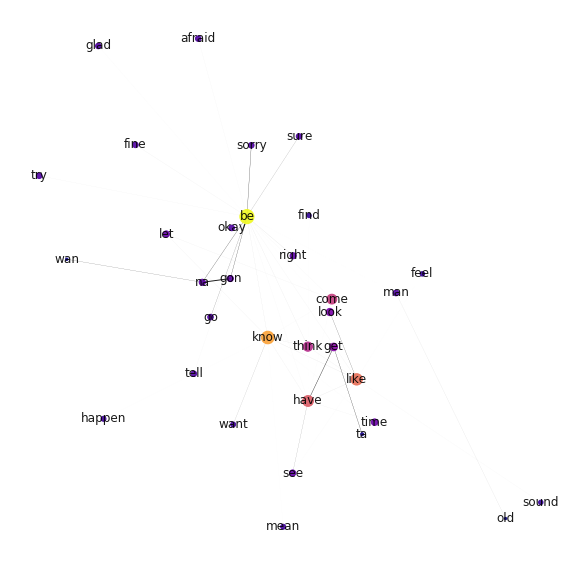

In [91]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(centralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant_sfi.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant_sfi.edges(data = True)))
nx.draw(giant_sfi, ax = ax, pos = layout, labels = {n:n for n in giant_sfi.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in giant_sfi.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities[n] / maxC for n in giant_sfi.nodes],
        node_size = [centralities[n] / maxC * 200 for n in giant_sfi.nodes],
        cmap = plt.get_cmap('plasma')) 

Note how the colors reveal a much more graduate distribution here. Let's look at it directly.

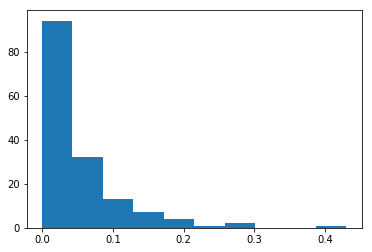

In [77]:
plt.hist(list(centralities.values()))
plt.show()

Top and bottom:

In [78]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('health', 0.42995279031459827),
 ('care', 0.2947914920794643),
 ('family', 0.2603644408806845),
 ('child', 0.2382674519067325),
 ('year', 0.2079239618802662),
 ('cost', 0.20661666982150814),
 ('state', 0.18895034623150686),
 ('program', 0.17974768076823017),
 ('plan', 0.16286095340939513),
 ('loan', 0.15444867005457827)]

In [79]:
sorted(centralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('right', 0.002379491404427387),
 ('labor', 0.0021785593770077536),
 ('intelligence', 0.0018622546091151765),
 ('report', 0.0015865384548653968),
 ('justice', 0.0015865384548653968),
 ('immediate', 0.000447560413509399),
 ('civil', 0.00018917863089936015),
 ('protect', 0.00017430529656646003),
 ('national', 0.00013641034495485814),
 ('war', 1.385814528262875e-05)]

We can now filter our network by a centrality measure. Let's define a function and experiment with it:

In [67]:
def filterWords(G, minWeight = 3, filter_ = "betweenness", rule = "number", value_of_rule = 200):
    """Function to filter network by degree centrality measures"""
    G = G.copy()
    try:
        G.remove_edges_from([(n1,n2) for n1, n2, d in G.edges(data = True) if d['weight'] < minWeight])
    except:
        print("weight might be missing from one or more edges")
        raise
    if filter_ =="betweenness":
        index = nx.betweenness_centrality(G) #betweeness centrality score
    elif filter_ == "closeness":
        index = nx.closeness_centrality(G) #closeness centrality score
    elif filter_ == "eigenvector":
        index = nx.eigenvector_centrality(G) #eigenvector centrality score
    elif filter_ == "degree":
        index = nx.degree_centrality(G) #degree centrality score
    else:
        raise ValueError("wrong filter paremeter, should be: betweenness/closeness/eigenvector")    
        
    if rule=='number':# if filter by limiting the total number of nodes 
        
        sorted_index = sorted(index.items(), key=lambda x:x[1], reverse=True)
        value_of_rule = np.min([value_of_rule, len(G.nodes)])
        
        nodes_remain = {}
        for word, centr in sorted_index[:value_of_rule]:
            nodes_remain[word] = centr
        G.remove_nodes_from([n for n in index if n not in nodes_remain])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G
    
    if rule=='above':# if filter by limiting the min value of centrality
        value_of_rule = np.max([float(value_of_rule),0])
        G.remove_nodes_from([n for n in index if index[n] >=value_of_rule])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G
    
    if rule=='below':# if filter by limiting the max value of centrality
        value_of_rule = np.max([float(value_of_rule),0])
        G.remove_nodes_from([n for n in index if index[n] <=value_of_rule])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G

In [81]:
giant_filtered30 = filterWords(giant, minWeight=3, filter_='betweenness', rule='number', value_of_rule=25)
print(nx.info(giant_filtered30))

Total number of nodes(after filtering) in the graph is 25
Name: 
Type: Graph
Number of nodes: 25
Number of edges: 112
Average degree:   8.9600


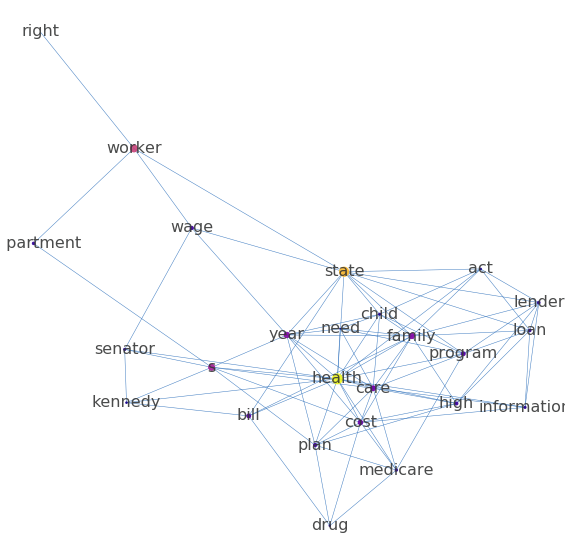

In [82]:
layout_giant_filtered30 = nx.spring_layout(giant_filtered30, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_giant30 = nx.betweenness_centrality(giant_filtered30)
maxC = max(centralities_giant30.items(), key = lambda x : x[1])[1]
nx.draw(giant_filtered30, ax = ax, pos = layout_giant_filtered30, labels = {n: n for n in giant_filtered30.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_giant30[n] / maxC for n in giant_filtered30.nodes],
        node_size = [centralities_giant30[n] / maxC * 100 for n in giant_filtered30.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

In [68]:
gianth_filtered30 = filterWords(giant_h, minWeight=3, filter_='betweenness', rule='number', value_of_rule=25)
print(nx.info(gianth_filtered30))

Total number of nodes(after filtering) in the graph is 25
Name: 
Type: Graph
Number of nodes: 25
Number of edges: 140
Average degree:  11.2000


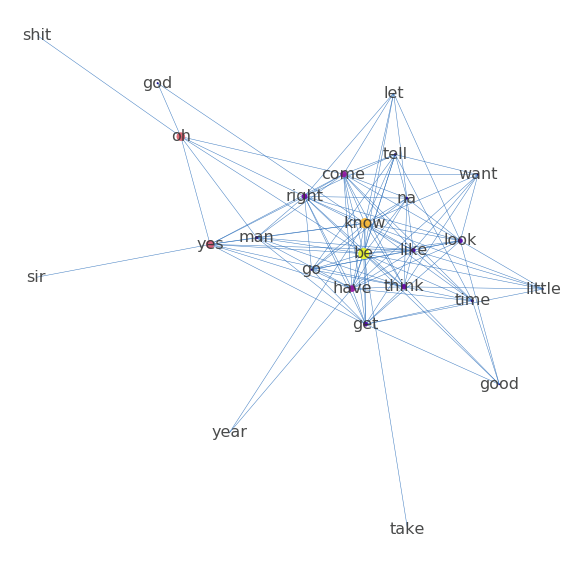

In [69]:
layout_gianth_filtered30 = nx.spring_layout(gianth_filtered30, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_gianth30 = nx.betweenness_centrality(gianth_filtered30)
maxC = max(centralities_gianth30.items(), key = lambda x : x[1])[1]
nx.draw(gianth_filtered30, ax = ax, pos = layout_gianth_filtered30, labels = {n: n for n in gianth_filtered30.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_gianth30[n] / maxC for n in gianth_filtered30.nodes],
        node_size = [centralities_gianth30[n] / maxC * 100 for n in gianth_filtered30.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

We can also look at global statistics, like the density of a network, defined as the number of actual edges divided by the total number of possible edges:

In [83]:
nx.density(giant)

0.03658433070197776

We can also calculate the average degree per node:

In [84]:
np.mean([v for w,v in nx.degree(giant)])

5.597402597402597

The diameter calculates the average distance between any two nodes in the network:

In [85]:
nx.diameter(giant)

9

# POS based networks

Now let's look at links between specific parts of speech within a network.



Let's look at nouns co-occurring in sentences using the top 10 (by score) reddit posts on thread topics we have explored in prior sessions:

In [86]:
redditDF = pandas.read_csv('../data/reddit.csv', index_col = 0)

In [87]:
redditTopScores = redditDF.sort_values('score')[-100:]
redditTopScores['sentences'] = redditTopScores['text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
redditTopScores.index = range(len(redditTopScores) - 1, -1,-1) #Reindex to make things nice in the future
redditTopScores[:3]

,author,over_18,score,subreddit,text,title,url,sentences
99,jimmy_three_shoes,False,4990,Tales From Tech Support,"This happened a little while ago, when I was c...","We've tried nothing, and we're all out of ideas!",https://www.reddit.com/r/talesfromtechsupport/...,"[[This, happened, a, little, while, ago, when,..."
98,badbfriend,False,5034,Relationships,https://www.reddit.com/r/relationships/comment...,"Me [29 M] with my g/f [27 F] together 4 years,...",https://www.reddit.com/r/relationships/comment...,[[https://www.reddit.com/r/relationships/comme...
97,Fafrdr,False,5146,Relationships,First post: https://www.reddit.com/r/relations...,Update - My [16F] father [59M] acts creepy tow...,https://www.reddit.com/r/relationships/comment...,"[[First, post, https://www.reddit.com/r/relati..."


Now we'll normalize the tokens through stemming:

In [88]:
redditTopScores['normalized_sents'] = redditTopScores['sentences'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

We will revisit spacy and use it's english language model.

In [70]:
import spacy

In [71]:
nlp = spacy.load('en_core_web_sm')

In [72]:
def posCooccurrence(sentences, *posType, makeMatrix = False):
    words = set()
    reducedSents = []
    #Only using the first kind of POS for each word
    wordsMap = {}
    for sent in sentences:
        s = [(w, t) for w, t in lucem_illud_2020.spacy_pos(sent) if t in posType]
        for w, t in s:
            if w not in wordsMap:
                wordsMap[w] = t
        reducedSent = [w for w, t in s]
        words |= set(reducedSent)
        reducedSents.append(reducedSent)
    wordLst = list(words)
    wordIndices = {w: i for i, w in enumerate(wordLst)}
    wordCoCounts = {}
    #consider a sparse matrix if memory becomes an issue
    coOcMat = np.zeros((len(wordIndices), len(wordIndices)))
    for sent in reducedSents:
        for i, word1 in enumerate(sent):
            word1Index = wordIndices[word1]
            for word2 in sent[i + 1:]:
                coOcMat[word1Index][wordIndices[word2]] += 1
    if makeMatrix:
        return coOcMat, wordLst
    else:
        coOcMat = coOcMat.T + coOcMat
        g = nx.convert_matrix.from_numpy_matrix(coOcMat)
        g = nx.relabel_nodes(g, {i : w for i, w in enumerate(wordLst)})
        for w in g.nodes:
            g.nodes[w]['bipartite'] = wordsMap[w]
        return g

In [92]:
gNN = posCooccurrence(redditTopScores['normalized_sents'].sum(), 'NN')

In [73]:
gNN = posCooccurrence(movie_scifi['normalized_sents'].sum(), 'NN')

In [74]:
print(nx.info(gNN))

Name: 
Type: Graph
Number of nodes: 3998
Number of edges: 14082
Average degree:   7.0445


This is a bit too large to effectively visualize, so let's remove the vertices with degree less than or equal to 100:

In [75]:
gNN.remove_nodes_from([n for n in gNN.nodes if len(set(gNN.neighbors(n))) <= 100]) 
#print(nx.info(gNN))

And low weight edges:

In [76]:
gNN.remove_edges_from([(n1, n2) for n1, n2, d in gNN.edges(data = True) if d['weight'] <= 2])
#print(nx.info(gNN))

In [77]:
print(nx.info(gNN))

Name: 
Type: Graph
Number of nodes: 15
Number of edges: 31
Average degree:   4.1333


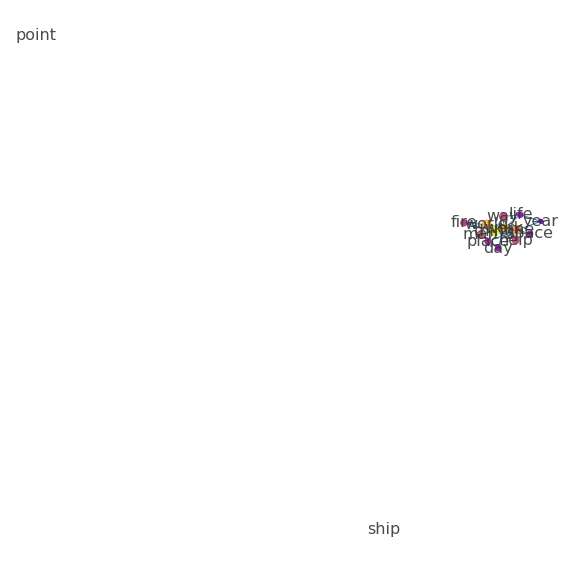

In [78]:
layout_nn = nx.spring_layout(gNN, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nn = nx.eigenvector_centrality(gNN)
maxC = max(centralities_nn.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNN.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNN.edges(data = True)))
nx.draw(gNN, ax = ax, pos = layout_nn, labels = {n: n for n in gNN.nodes()},
        #width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNN.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_nn[n] / maxC for n in gNN.nodes],
        node_size = [centralities_nn[n] / maxC * 100 for n in gNN.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

This makes sense: people are talking about work, support, computers, time... it's a tech support forum, so these are expected connections.

What if we want to look at noun-verb pairs instead?

In [97]:
gNV = posCooccurrence(redditTopScores['normalized_sents'].sum(), 'NN', 'VB')

`gNV` has co-occurrences between nouns and nouns as well as between verbs and verbs. Let's remove these and make it purely about noun and verb combinations:

In [98]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 2161
Number of edges: 18115
Average degree:  16.7654


In [99]:
gNV.remove_edges_from([(n1,n2) for n1,n2,d in gNV.edges(data = True) if gNV.nodes[n1]['bipartite'] == gNV.nodes[n2]['bipartite']])

In [100]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 2161
Number of edges: 5786
Average degree:   5.3549


Dropping low weight edges and low degree vertices gives us:

In [101]:
gNV.remove_edges_from([(n1, n2) for n1, n2, d in gNV.edges(data = True) if d['weight'] <= 2])
gNV.remove_nodes_from([n for n in gNV.nodes if len(set(gNV.neighbors(n))) <= 5])

In [102]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 20
Number of edges: 50
Average degree:   5.0000


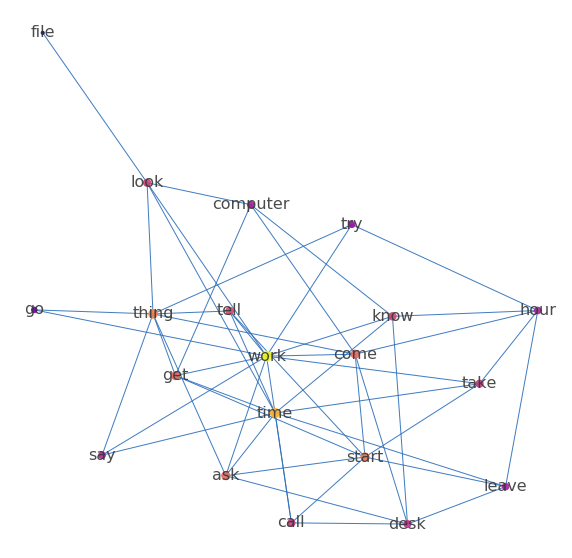

In [103]:
layout_nn = nx.spring_layout(gNV, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nv = nx.eigenvector_centrality(gNV)
maxC = max(centralities_nv.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNV.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNV.edges(data = True)))
nx.draw(gNV, ax = ax, pos = layout_nn, labels = {n: n for n in gNV.nodes()},
        #width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNN.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_nv[n] / maxC for n in gNV.nodes],
        node_size = [centralities_nv[n] / maxC * 100 for n in gNV.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       ) 

Lets create an "ego network" surrounding a single (important) word, as we did before:

In [104]:
g_i = gNV.subgraph(['work'] + list(gNV.neighbors('work')))

In [105]:
print(nx.info(g_i))

Name: 
Type: Graph
Number of nodes: 12
Number of edges: 11
Average degree:   1.8333


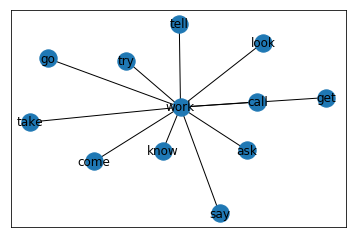

In [106]:
nx.draw_networkx(g_i)

Instead of just nodes connected to a vertex, we can find all those connected to it within 2 hops, lets look at 'look' (+ points for being meta) for this:

In [107]:
storyNeighbors = gNV.neighbors('look')
set(storyNeighbors)

{'computer', 'file', 'thing', 'time', 'work'}

In [108]:
storyNeighbors = set(gNV.neighbors('look'))
storyNeighborsPlus1 = set(storyNeighbors)
for n in storyNeighbors:
    storyNeighborsPlus1 |= set(gNV.neighbors(n))

In [109]:
gNV_story = gNV.subgraph(storyNeighborsPlus1)
print(nx.info(gNV_story))

Name: 
Type: Graph
Number of nodes: 17
Number of edges: 33
Average degree:   3.8824


This is a mid-sized network, but we can interrogate it intelligently by computing some statistics. Degree centrality:

In [110]:
sorted(nx.degree_centrality(gNV_story).items(), key = lambda x: x[1], reverse = True)[:10]

[('work', 0.6875),
 ('time', 0.5625),
 ('thing', 0.5),
 ('look', 0.3125),
 ('computer', 0.25),
 ('get', 0.25),
 ('know', 0.1875),
 ('tell', 0.1875),
 ('say', 0.1875),
 ('come', 0.1875)]

Or eigenvector centrality:

In [111]:
sorted(nx.eigenvector_centrality(gNV_story).items(), key = lambda x: x[1], reverse = True)[:10]

[('work', 0.45363345471384553),
 ('time', 0.3657602779138192),
 ('thing', 0.3494247945382785),
 ('look', 0.28025415645119023),
 ('get', 0.26921641691621967),
 ('tell', 0.23195961462158712),
 ('say', 0.23195961462158712),
 ('ask', 0.23195961462158712),
 ('know', 0.19987080098426385),
 ('come', 0.1966289183966515)]

Lets plot it:

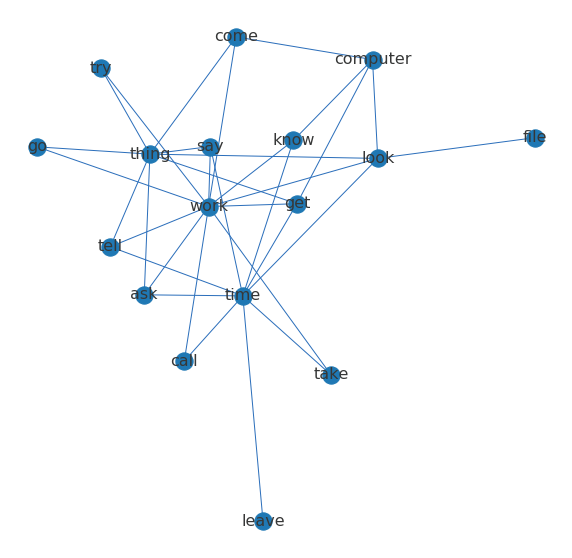

Lets create a noun-adjective network:

## <span style="color:red">*Exercise 3*</span>

<span style="color:red">Construct cells immediately below this that construct at least two different networks comprising different combinations of word types, linked by different syntactic structures, which illuminate your corpus and the dynamics you are interested to explore. Graph these networks or subnetworks within them. What are relationships that are meaningful? 

<span style="color:red">***Stretch***: Graph some word-centered "ego-networks" with words one link away, two links away, and three links away (we only did up to two links away above).

### NOUN-ADJECTIVE

In [131]:
gNJ = posCooccurrence(movie_war['normalized_sents'][:100].sum(), 'NN', 'JJ')
print(nx.info(gNJ))
#Did the same for the other movie types below

Name: 
Type: Graph
Number of nodes: 2775
Number of edges: 9076
Average degree:   6.5413


By filtering by a centrality measure we can get a more 'central' set of nodes instead of just the most connected.

In [115]:
gNJ_filtered200 = filterWords(gNJ, minWeight=3, filter_='betweenness', rule='number', value_of_rule=25)
print(nx.info(gNJ_filtered200))

Total number of nodes(after filtering) in the graph is 25
Name: 
Type: Graph
Number of nodes: 25
Number of edges: 38
Average degree:   3.0400


### WAR MOVIES

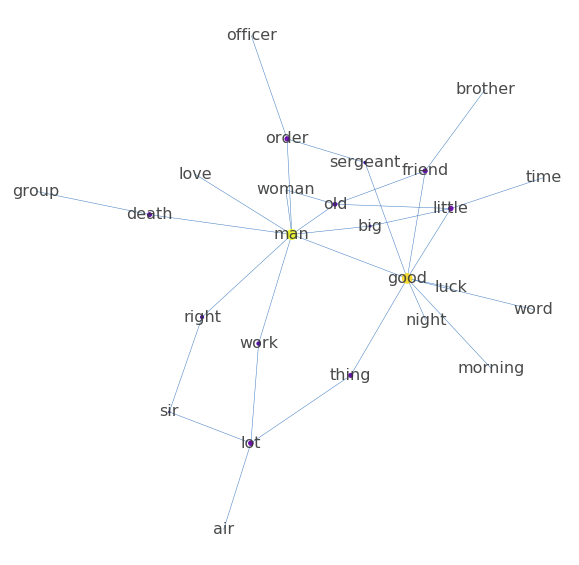

In [116]:
layout_NJ_filtered200 = nx.spring_layout(gNJ_filtered200, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nj200 = nx.betweenness_centrality(gNJ_filtered200)
maxC = max(centralities_nj200.items(), key = lambda x : x[1])[1]
nx.draw(gNJ_filtered200, ax = ax, pos = layout_NJ_filtered200, labels = {n: n for n in gNJ_filtered200.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_nj200[n] / maxC for n in gNJ_filtered200.nodes],
        node_size = [centralities_nj200[n] / maxC * 100 for n in gNJ_filtered200.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

### ROMANCE MOVIES

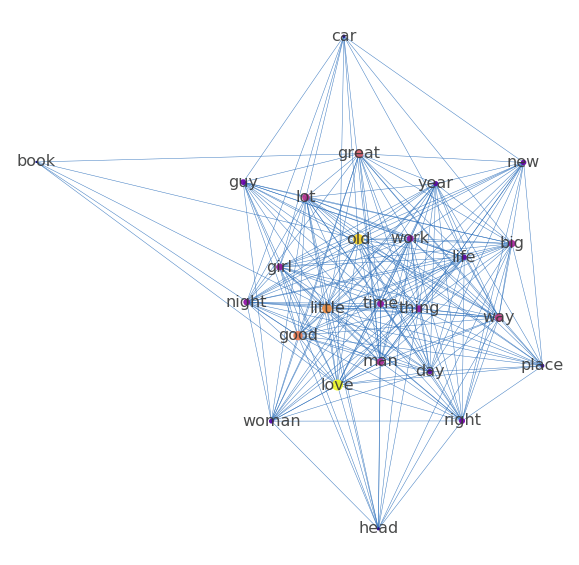

In [110]:
layout_NJ_filtered200 = nx.spring_layout(gNJ_filtered200, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nj200 = nx.betweenness_centrality(gNJ_filtered200)
maxC = max(centralities_nj200.items(), key = lambda x : x[1])[1]
nx.draw(gNJ_filtered200, ax = ax, pos = layout_NJ_filtered200, labels = {n: n for n in gNJ_filtered200.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_nj200[n] / maxC for n in gNJ_filtered200.nodes],
        node_size = [centralities_nj200[n] / maxC * 100 for n in gNJ_filtered200.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

### HORROR MOVIES

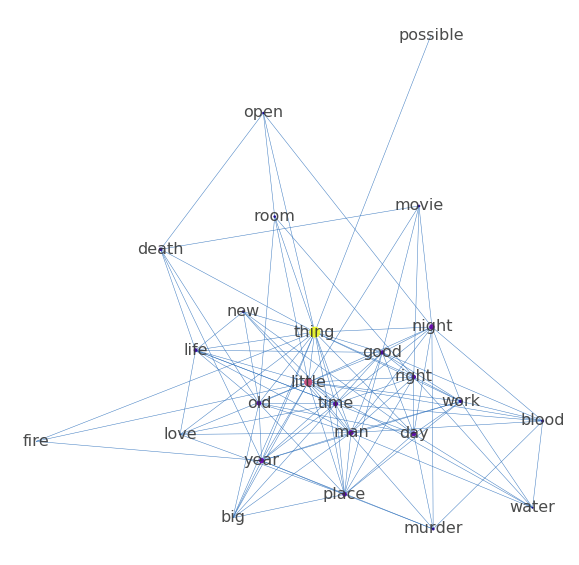

In [94]:
layout_NJ_filtered200 = nx.spring_layout(gNJ_filtered200, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nj200 = nx.betweenness_centrality(gNJ_filtered200)
maxC = max(centralities_nj200.items(), key = lambda x : x[1])[1]
nx.draw(gNJ_filtered200, ax = ax, pos = layout_NJ_filtered200, labels = {n: n for n in gNJ_filtered200.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_nj200[n] / maxC for n in gNJ_filtered200.nodes],
        node_size = [centralities_nj200[n] / maxC * 100 for n in gNJ_filtered200.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

### SCI-FI MOVIES

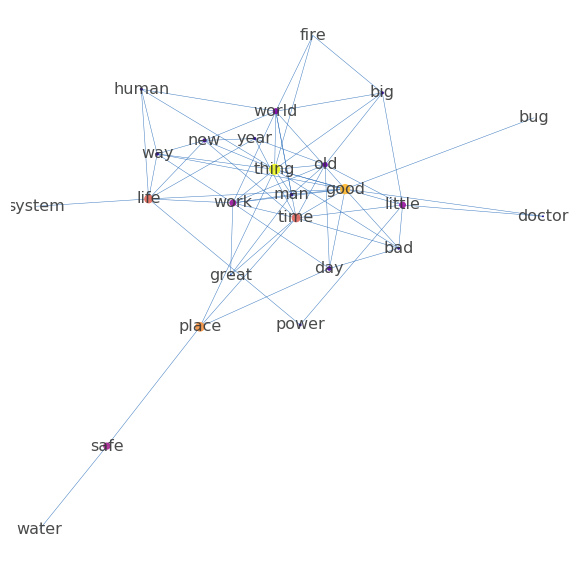

In [81]:
layout_NJ_filtered200 = nx.spring_layout(gNJ_filtered200, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nj200 = nx.betweenness_centrality(gNJ_filtered200)
maxC = max(centralities_nj200.items(), key = lambda x : x[1])[1]
nx.draw(gNJ_filtered200, ax = ax, pos = layout_NJ_filtered200, labels = {n: n for n in gNJ_filtered200.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_nj200[n] / maxC for n in gNJ_filtered200.nodes],
        node_size = [centralities_nj200[n] / maxC * 100 for n in gNJ_filtered200.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

## NOUN-VERB 

### War Movies

In [133]:
gNV = posCooccurrence(movie_war['normalized_sents'].sum(), 'NN', 'VB')

`gNV` has co-occurrences between nouns and nouns as well as between verbs and verbs. Let's remove these and make it purely about noun and verb combinations:

In [135]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 2344
Number of edges: 9824
Average degree:   8.3823


In [136]:
gNV.remove_edges_from([(n1,n2) for n1,n2,d in gNV.edges(data = True) if gNV.nodes[n1]['bipartite'] == gNV.nodes[n2]['bipartite']])

In [137]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 2344
Number of edges: 4451
Average degree:   3.7978


Dropping low weight edges and low degree vertices gives us:

In [138]:
gNV.remove_edges_from([(n1, n2) for n1, n2, d in gNV.edges(data = True) if d['weight'] <= 2])
gNV.remove_nodes_from([n for n in gNV.nodes if len(set(gNV.neighbors(n))) <= 5])

In [139]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 13
Number of edges: 19
Average degree:   2.9231


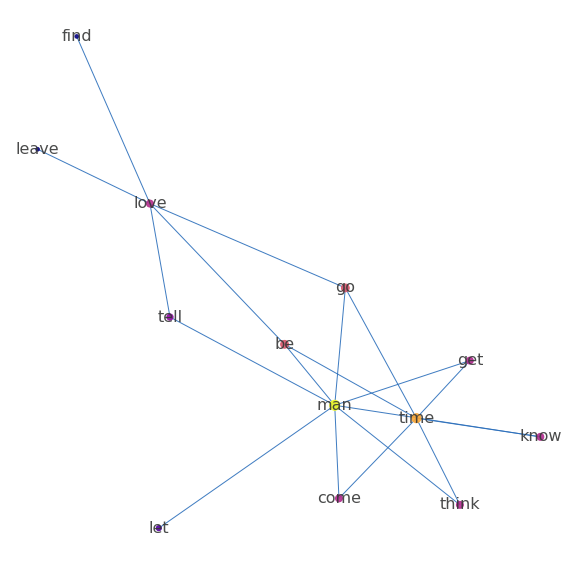

In [140]:
layout_nn = nx.spring_layout(gNV, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nv = nx.eigenvector_centrality(gNV)
maxC = max(centralities_nv.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNV.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNV.edges(data = True)))
nx.draw(gNV, ax = ax, pos = layout_nn, labels = {n: n for n in gNV.nodes()},
        #width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNN.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_nv[n] / maxC for n in gNV.nodes],
        node_size = [centralities_nv[n] / maxC * 100 for n in gNV.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       ) 

Lets create an "ego network" surrounding a single (important) word, as we did before:

In [142]:
g_i = gNV.subgraph(['man'] + list(gNV.neighbors('man')))

In [143]:
print(nx.info(g_i))

Name: 
Type: Graph
Number of nodes: 9
Number of edges: 8
Average degree:   1.7778


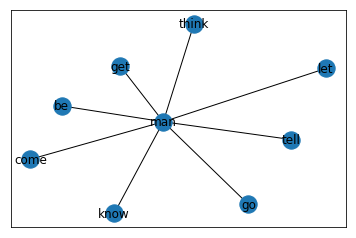

In [144]:
nx.draw_networkx(g_i)

Instead of just nodes connected to a vertex, we can find all those connected to it within 2 hops, lets look at 'look' (+ points for being meta) for this:

In [145]:
storyNeighbors = gNV.neighbors('know')
set(storyNeighbors)

{'man', 'time'}

In [146]:
storyNeighbors = set(gNV.neighbors('know'))
storyNeighborsPlus1 = set(storyNeighbors)
for n in storyNeighbors:
    storyNeighborsPlus1 |= set(gNV.neighbors(n))

In [147]:
gNV_story = gNV.subgraph(storyNeighborsPlus1)
print(nx.info(gNV_story))

Name: 
Type: Graph
Number of nodes: 10
Number of edges: 14
Average degree:   2.8000


This is a mid-sized network, but we can interrogate it intelligently by computing some statistics. Degree centrality:

In [148]:
sorted(nx.degree_centrality(gNV_story).items(), key = lambda x: x[1], reverse = True)[:10]

[('man', 0.8888888888888888),
 ('time', 0.6666666666666666),
 ('think', 0.2222222222222222),
 ('be', 0.2222222222222222),
 ('come', 0.2222222222222222),
 ('go', 0.2222222222222222),
 ('know', 0.2222222222222222),
 ('get', 0.2222222222222222),
 ('let', 0.1111111111111111),
 ('tell', 0.1111111111111111)]

Or eigenvector centrality:

In [149]:
sorted(nx.eigenvector_centrality(gNV_story).items(), key = lambda x: x[1], reverse = True)[:10]

[('man', 0.5395359461384224),
 ('time', 0.45705551442139464),
 ('think', 0.2755297458023203),
 ('be', 0.2755297458023203),
 ('come', 0.2755297458023203),
 ('go', 0.2755297458023203),
 ('know', 0.2755297458023203),
 ('get', 0.2755297458023203),
 ('let', 0.1491666427693613),
 ('tell', 0.1491666427693613)]

Lets plot it:

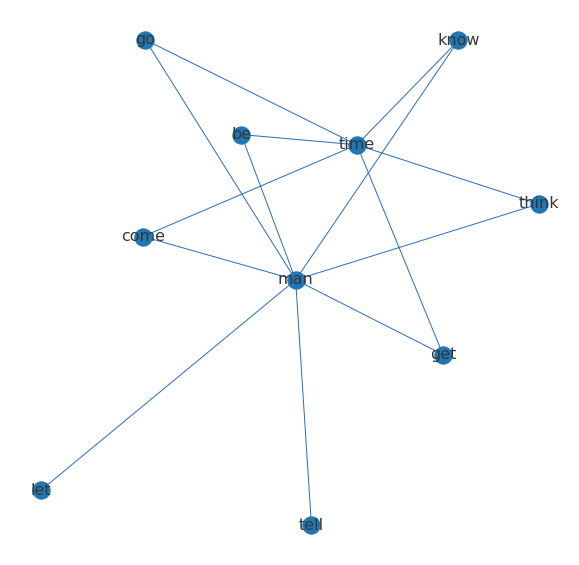

In [150]:
layout_story = nx.spring_layout(gNV_story, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(gNV_story, ax = ax, pos = layout_story, labels = {n: n for n in gNV_story.nodes()},
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
       ) 

### SCI-FI MOVIES

In [151]:
gNV = posCooccurrence(movie_scifi['normalized_sents'].sum(), 'NN', 'VB')

`gNV` has co-occurrences between nouns and nouns as well as between verbs and verbs. Let's remove these and make it purely about noun and verb combinations:

In [152]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 4318
Number of edges: 25215
Average degree:  11.6790


In [153]:
gNV.remove_edges_from([(n1,n2) for n1,n2,d in gNV.edges(data = True) if gNV.nodes[n1]['bipartite'] == gNV.nodes[n2]['bipartite']])

In [154]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 4318
Number of edges: 10002
Average degree:   4.6327


Dropping low weight edges and low degree vertices gives us:

In [155]:
gNV.remove_edges_from([(n1, n2) for n1, n2, d in gNV.edges(data = True) if d['weight'] <= 2])
gNV.remove_nodes_from([n for n in gNV.nodes if len(set(gNV.neighbors(n))) <= 5])

In [156]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 36
Number of edges: 146
Average degree:   8.1111


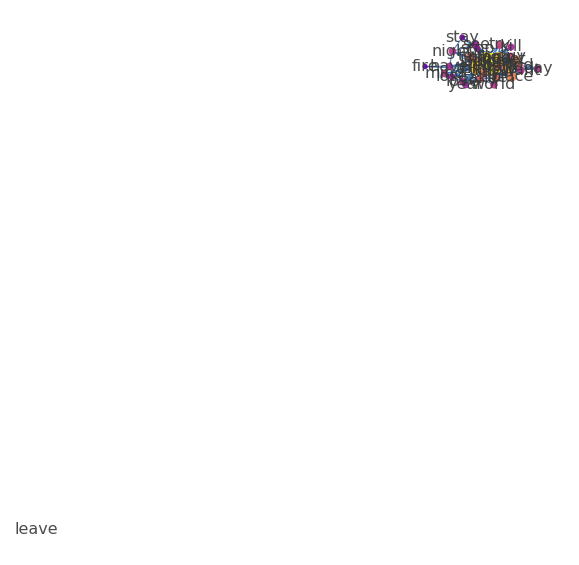

In [157]:
layout_nn = nx.spring_layout(gNV, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nv = nx.eigenvector_centrality(gNV)
maxC = max(centralities_nv.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNV.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNV.edges(data = True)))
nx.draw(gNV, ax = ax, pos = layout_nn, labels = {n: n for n in gNV.nodes()},
        #width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNN.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_nv[n] / maxC for n in gNV.nodes],
        node_size = [centralities_nv[n] / maxC * 100 for n in gNV.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       ) 

Lets create an "ego network" surrounding a single (important) word, as we did before:

In [158]:
g_i = gNV.subgraph(['man'] + list(gNV.neighbors('man')))

In [159]:
print(nx.info(g_i))

Name: 
Type: Graph
Number of nodes: 16
Number of edges: 15
Average degree:   1.8750


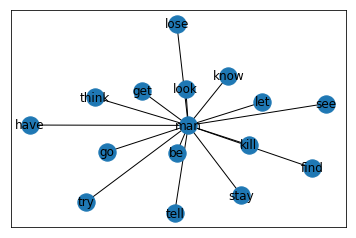

In [160]:
nx.draw_networkx(g_i)

Instead of just nodes connected to a vertex, we can find all those connected to it within 2 hops, lets look at 'look' (+ points for being meta) for this:

In [161]:
storyNeighbors = gNV.neighbors('know')
set(storyNeighbors)

{'come',
 'day',
 'guy',
 'help',
 'life',
 'love',
 'man',
 'place',
 'thing',
 'time',
 'way',
 'work',
 'world',
 'year'}

In [162]:
storyNeighbors = set(gNV.neighbors('know'))
storyNeighborsPlus1 = set(storyNeighbors)
for n in storyNeighbors:
    storyNeighborsPlus1 |= set(gNV.neighbors(n))

In [163]:
gNV_story = gNV.subgraph(storyNeighborsPlus1)
print(nx.info(gNV_story))

Name: 
Type: Graph
Number of nodes: 32
Number of edges: 131
Average degree:   8.1875


This is a mid-sized network, but we can interrogate it intelligently by computing some statistics. Degree centrality:

In [164]:
sorted(nx.degree_centrality(gNV_story).items(), key = lambda x: x[1], reverse = True)[:10]

[('thing', 0.4838709677419355),
 ('man', 0.4838709677419355),
 ('time', 0.4838709677419355),
 ('know', 0.45161290322580644),
 ('be', 0.4193548387096774),
 ('come', 0.4193548387096774),
 ('help', 0.3870967741935484),
 ('go', 0.3548387096774194),
 ('think', 0.3548387096774194),
 ('get', 0.3225806451612903)]

Or eigenvector centrality:

In [165]:
sorted(nx.eigenvector_centrality(gNV_story).items(), key = lambda x: x[1], reverse = True)[:10]

[('thing', 0.26217644886790153),
 ('know', 0.2618184496880327),
 ('time', 0.25608949965121774),
 ('be', 0.2519994138025521),
 ('man', 0.2517615895197078),
 ('come', 0.2413529862520671),
 ('help', 0.23057982768923002),
 ('go', 0.22771248412574158),
 ('think', 0.2242022069853444),
 ('get', 0.21240247038996005)]

Lets plot it:

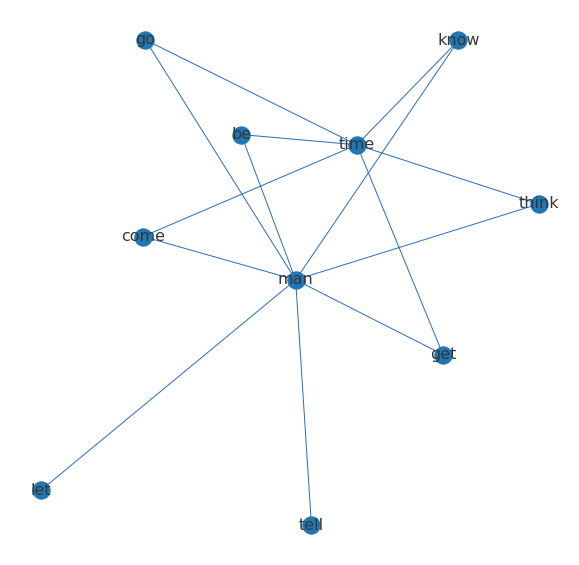

In [150]:
layout_story = nx.spring_layout(gNV_story, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(gNV_story, ax = ax, pos = layout_story, labels = {n: n for n in gNV_story.nodes()},
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
       ) 

As can be seen, we get meaningful insights from the noun-adjective connections for the different movies where we can see that war movies have themes we expect to see like officer and seargent and horror films have themes like blood, murder and death for example. The multiple ego networks from the verb-noun relationship aso corroborates this information.

## Creating networks of agents from corpora

Now that we have an idea of how we can use networks in python (a useful skill to know!), let us see how we can now use our knowledge of networks on extracting actors from corpora and building relations from them. Let us use the soap opera corpus now. 

In the last notebook we wrote methods to load corpora - this has been added to lucem_illud_2020.
The code returns a dictionary with each id mapping to the text associated with it. 

We would then use the source file to create the dataframe with the data - since this varies for each corpora, there is no built in function, but would follow a similar process.

This function might take some time.

In [1]:
corpora_address = "/Users/bhargavvader/Downloads/Academics_Tech/corpora/SOAP"

In [166]:
soap_texts = lucem_illud_2020.loadDavies(corpora_address, num_files=2000)

NameError: name 'corpora_address' is not defined

We now use the source to see how the data is stored. Note that this is different from the movies corpus, and that we will need to use a different aggregating method to store the data. Each dataset would have a different approach, but they are all very similar, it depends on how the data is stored. Here multiple textids match multiple scripts, so our soap dataframe would be structured a little differently. 

You can see the first 20 lines of the source file here.

In [4]:
import zipfile

In [5]:
zfile = zipfile.ZipFile(corpora_address + "/soap_sources.zip")
source = []

In [6]:
for file in zfile.namelist():
    with zfile.open(file) as f:
        for line in f:
            source.append(line)

In [7]:
source[0:20]

[b'textID\tyear\tshow\t\turl\r\n',
 b'-----\t-----\t-----\t\t-----\r\n',
 b'\r\n',
 b'1\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-04-09-01.shtml\r\n',
 b'2\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-05-09-01.shtml\r\n',
 b'3\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-06-20-01.shtml\r\n',
 b'4\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-08-07-01.shtml\r\n',
 b'5\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-08-08-01.shtml\r\n',
 b'6\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-08-09-01.shtml\r\n',
 b'7\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-08-10-01.shtml\r\n',
 b'8\t2001\tAll My Childen\thttp://tvmegasite.net/transcripts/amc/older/2001/amc-trans-08-13-01.shtml\r\n',
 b'9\t2001\tAll My Childen\thttp://tvmegasite.net/tra

In [167]:
import pandas as pd

In [9]:
soap_dict = {}

In [10]:
for soap in source[3:]:
    try:
        textID, year, show, url = soap.decode("utf-8").split("\t")
    except UnicodeDecodeError:
        continue
    if show.strip() not in soap_dict:
        soap_dict[show.strip()] = []
    if show.strip() in soap_dict:
        try:
            soap_dict[show.strip()].append(soap_texts[textID.strip()])
        except KeyError:
            continue

In [11]:
soap_dict.keys()

dict_keys(['One Life to Live', 'As the World Turns', 'Passions', 'Days of Our Lives', 'Guiding Light', 'General Hospital', 'All My Childen', 'Port Charles', 'Bold and Beautiful', 'Young and Restless'])

In [12]:
soap_df = pd.DataFrame(columns=["Soap Name", "Tokenized Texts"])

In [13]:
i = 0

In [14]:
for soap in soap_dict:
    # since there were multiple lists
    print(soap)
    full_script = []
    for part in soap_dict[soap]:
        full_script = full_script + part
    soap_df.loc[i] = [soap, full_script]
    i += 1

One Life to Live
As the World Turns
Passions
Days of Our Lives
Guiding Light
General Hospital
All My Childen
Port Charles
Bold and Beautiful
Young and Restless


In [15]:
soap_df

,Soap Name,Tokenized Texts
0,One Life to Live,"[@!Blair, Excuse, me, @!Todd, Why, Did, you, d..."
1,As the World Turns,"[@!Katie, Okay, I, know, these, words, are, lo..."
2,Passions,"[@!Julian, Let, 's, drink, up, It, 's, not, ev..."
3,Days of Our Lives,"[@!Maggie, How, are, you, doing, @!Victor, Fin..."
4,Guiding Light,"[@!Dax, I, take, it, everything, is, well, wit..."
5,General Hospital,"[@!Luke, I, signed, my, divorce, papers, You, ..."
6,All My Childen,"[@!Reporter, Is, there, anything, you, regret,..."
7,Port Charles,"[@!Frank, Hey, @!Karen, Hey, You, still, on, d..."
8,Bold and Beautiful,"[@!Bridget, What, did, you, say, @!Deacon, Jus..."
9,Young and Restless,"[@!Katherine, Any, sign, of, your, daddy, swee..."


We now have each Soap, and each of the Tokenized texts. Let us see what kind of information we can get. These are American soap operas, and are likely to be cheesy and dramatic (an understatment). A fun start would be to make networks of each of the actors and actresses in these soaps. 

What would be a good way to create a network? Maybe everytime someone talks to someone we add one weight? But we wouldn't want to add weights whenever it's a different scene - or maybe we do? Let us look at the text and figure it out.

Note that we didn't add the year here because it spans over multiple years. If we are doing different kinds of analysis we would want to a years column as well.

In my dataframe, Days of Our Lives is the 9th corpora, and I conducted my basic analysis on that.

In [16]:
dool = soap_df['Tokenized Texts'][3]

In [17]:
' '.join(dool[0:1500])

"@!Maggie How are you doing @!Victor Fine @!Nicole Humming this ought to ease the pain @!Victor You wo n't be offended if I tell you I 'm not in the mood @!Nicole Oh come on @!Victor Looking around at what 's been going on here I hardly see what we have to toast to @!Nicole How about to us To survivors @!Maggie You all right @!Nicole Yeah @!Maggie Okay @!Philip Hey Chloe @!Chloe How 's Lexie @!Philip Does n't look so good but John and Marlena did everything they can How are you How are you holding up @!Chloe I 'm fine Philip okay I just need to be alone @!John It 's not enough Wounds are too severe @!Marlena We have no choice She 's got to get to the hospital @!Maggie Okay @!Hope Is there any news @!Maggie Mickey said there were explosions all over town and no one knows why Most of the roads are still blocked and they 're telling My daughter There 's no time We have to get her to the hospital @!Maggie Even if the roads were clear Stefano the ambulances are all in use There are victims 

Hmmm... we can't do our normal text processing. But this provides us with an interesting oppurtunity: every '@!' is followed by some useeful information. Let us do a quick check of how many characters exist here, and how many times they speak.

In [18]:
characters = {}

In [19]:
for token in dool:
    if token[0] == '@':
        # all characters or actions start with @, so we add that to character
        if token[2:] not in characters:
            characters[token[2:]] = 0
        if token[2:] in characters:
            characters[token[2:]] += 1


In [248]:
len(characters)

908

Wow, that's a lot of characters: but we notice a '@!' between certain actions too, such as screaming and sobbing. Let us maybe only look for characters with a high number of appearances?

In [21]:
for character in characters:
    if characters[character] > 2000:
        print(character, characters[character])

John 2403
Lucas 2380
Brady 2183
Jennifer 2163
Nicole 3399
Hope 3520
Belle 2783
Philip 2568
Bo 3830
Sami 5246
Kate 2419
Shawn 2952


Let's check these folks out on the interwebz...a image of search of the name + "days of our lives":

These are definitely big, long-time players in the dramatic Days narrative. It would make sense to create a graph where each character who appears over 2000 times is a node, and each time they talk to each other, we add one to their weight. We should also store all the things these chracters say: that's useful information.

So we now iterate through the tokens in a manner where we can capture this information.

In [22]:
actor_network = nx.Graph()

In [23]:
for character in characters:
    if characters[character] > 2000:
        actor_network.add_node(character, lines_spoken= characters[character], words=[])

In [24]:
len(actor_network.nodes.data())

12

In [25]:
actor_network.nodes.data()

NodeDataView({'Hope': {'words': [], 'lines_spoken': 3520}, 'Kate': {'words': [], 'lines_spoken': 2419}, 'Lucas': {'words': [], 'lines_spoken': 2380}, 'Belle': {'words': [], 'lines_spoken': 2783}, 'Nicole': {'words': [], 'lines_spoken': 3399}, 'Philip': {'words': [], 'lines_spoken': 2568}, 'Brady': {'words': [], 'lines_spoken': 2183}, 'John': {'words': [], 'lines_spoken': 2403}, 'Shawn': {'words': [], 'lines_spoken': 2952}, 'Sami': {'words': [], 'lines_spoken': 5246}, 'Jennifer': {'words': [], 'lines_spoken': 2163}, 'Bo': {'words': [], 'lines_spoken': 3830}})

In [26]:
actor_network.nodes['Sami']['lines_spoken']

5246

In [27]:
i = 0

The following lines of code creates the graph. Please carefully go through the code: you should be able to understand (more or less) what is going on here. 

In [28]:
for token in dool:
    i += 1
    if i > len(dool):
        break
    if token[0] == "@":
        if token[2:] in actor_network.nodes():
            j = i
            for token_ in dool[i:]:
                if token_[0] == "@":
                    # if both the characters exist in the graph, add a weight
                    if token_[2:] != token[2:] and token_[2:] in actor_network.nodes():
                        if (token[2:], token_[2:]) not in actor_network.edges():
                            actor_network.add_edge(token[2:], token_[2:], weight=0)
                        if (token[2:], token_[2:]) in actor_network.edges():
                            actor_network.edges[(token[2:], token_[2:])]['weight'] += 1
                    break
                j += 1
            # adding characters sentences
            actor_network.nodes[token[2:]]['words'].append(dool[i:j])

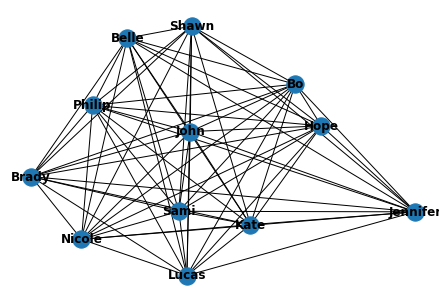

In [29]:
nx.draw(actor_network, with_labels=True, font_weight='bold')

In [30]:
import seaborn as sns

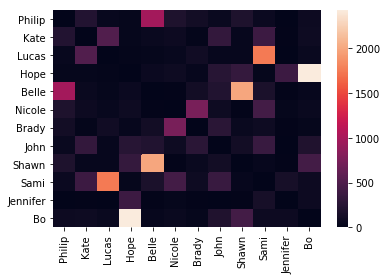

In [31]:
L = []
for node in actor_network.nodes():
    l = []
    for node_ in actor_network.nodes():
        if node == node_:
            l.append(0)
        else:
            l.append(actor_network.edges[(node, node_)]['weight'])
    L.append(l)
M_ = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M_, columns = list(actor_network.nodes()), index = list(actor_network.nodes()))
ax = sns.heatmap(div)
plt.show()

In [32]:
from networkx.algorithms.community import greedy_modularity_communities
c = list(greedy_modularity_communities(actor_network))

In [33]:
c

[frozenset({'Belle',
            'Bo',
            'Brady',
            'Hope',
            'Jennifer',
            'John',
            'Kate',
            'Lucas',
            'Nicole',
            'Philip',
            'Sami',
            'Shawn'})]

### Finding structure in networks

We now have a lot of useful information: we have a graph of all the characters, with their relationships with other characters, as well as all the words they've said. We tried finding communities, but it seems like everyone is connected to everyone: each of them form their own 'community'. Seems like people talk to each other a bunch in soaps.

This is however, not the best network to find any meaningful patterns, as we can see with everyone connected to everyone. But as we can see with our heatmap, not everyone talks to everyone an equal amount. How about we only keep our "important" ties, where people are talking to each other a lot?

In [55]:
smaller_actor_network = nx.Graph()

In [56]:
for actor_1 in actor_network.nodes():
    smaller_actor_network.add_node(actor_1, lines_spoken= actor_network.nodes[actor_1]['lines_spoken'], words=actor_network.nodes[actor_1]['words'])
    for actor_2 in actor_network.nodes():
        if actor_2!=actor_1 and actor_network.edges[(actor_1, actor_2)]['weight'] > 250:
            smaller_actor_network.add_edge(actor_1, actor_2, weight=actor_network.edges[(actor_1, actor_2)]['weight'])


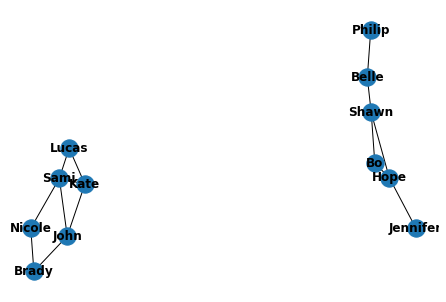

In [57]:
nx.draw(smaller_actor_network, with_labels=True, font_weight='bold')

This is a lot more interesting: while the sets of characters overlap, there is still two distinct communities if you look at characters who regularly talk to each other!

Let us see what our centrality measures look like, as well as communities.

In [168]:
from networkx.algorithms.community import greedy_modularity_communities
c = list(greedy_modularity_communities(smaller_actor_network))

NameError: name 'smaller_actor_network' is not defined

In [54]:
c

[frozenset({'Brady', 'John', 'Kate', 'Lucas', 'Nicole', 'Sami'}),
 frozenset({'Belle', 'Bo', 'Hope', 'Jennifer', 'Philip', 'Shawn'})]

In [59]:
dcentralities = nx.degree_centrality(smaller_actor_network)

In [63]:
dcentralities['John'], dcentralities['Philip']

(0.2727272727272727, 0.09090909090909091)

Our two different communities show up as detected by the networkx algorithm, and when we look at centralities, we can see that John is a lot more central than Philip.

Let us go back to our original graph, and see if the weight or number of similar appearences matches the text... how do we do this? Well, we already have the graph, and we also have information of who spoke to who. So we have our framework!

This means we can explore ideas contained in two of the papers you will be reading: . “No country for old members: User lifecycle and linguistic change in online communities.”, and  “Fitting In or Standing Out? The Tradeoffs of Structural and Cultural Embeddedness”, both of which you can access on Canvas. 

Let us use a simplified version of the papers, and check if a higher number of conversations might lead to a higher similarity between the word distributions for two characters. We can use the same divergences we used in the last notebook. Do you think it will match with the number of times each character was associated with each other?

In [169]:
import nltk

In [263]:
def kl_divergence(X, Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    D_kl = scipy.stats.entropy(p, q)
    return D_kl

def chi2_divergence(X,Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    return scipy.stats.chisquare(p, q).statistic

def Divergence(corpus1, corpus2, difference="KL"):
    """Difference parameter can equal KL, Chi2, or Wass"""
    freqP = nltk.FreqDist(corpus1)
    P = pandas.DataFrame(list(freqP.values()), columns = ['frequency'], index = list(freqP.keys()))
    freqQ = nltk.FreqDist(corpus2)
    Q = pandas.DataFrame(list(freqQ.values()), columns = ['frequency'], index = list(freqQ.keys()))
    if difference == "KL":
        return kl_divergence(P, Q)
    elif difference == "Chi2":
        return chi2_divergence(P, Q)
    elif difference == "KS":
        try:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency']).statistic
        except:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency'])
    elif difference == "Wasserstein":
        try:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None).statistic
        except:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None)

In [264]:
corpora = []
for character in actor_network.nodes():
    character_words = []
    for sentence in actor_network.nodes[character]['words']:
        for word in sentence:
            character_words.append(word)
    corpora.append(lucem_illud_2020.normalizeTokens(character_words))

In [265]:
L = []

In [266]:
for p in corpora:
    l = []
    for q in corpora:
        l.append(Divergence(p,q, difference='KS'))
    L.append(l)
M = np.array(L)

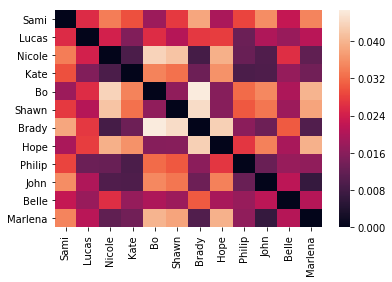

In [267]:
fig = plt.figure()
div = pandas.DataFrame(M, columns = list(actor_network.nodes()), index = list(actor_network.nodes()))
ax = sns.heatmap(div)
plt.show()

In [268]:
# np.corrcoef(M_, M)[0]

With our two heatplots, we can attempt to do some rudimentary analysis. We can see from our previous plot that Shawn and Belle talk to each other a lot, so do Hope and Bo, and Nicole and Brady, and Lucas and Sami. Do they also talk *like* each other?

Kind of, actually: all four of these pairs have a lower distance between them. Now I don't know anything about this particular soap... are these four pairs related? Are they in a relationship, either married or dating, or are they just really good friends?

This lays out the frameworks which you can now use to explore your own networks. 

# Interactional influence

In a recent paper by Fangjian Guo, Charles Blundell, Hanna Wallach, and Katherine Heller entitled ["The Bayesian Echo Chamber: Modeling Social Influence via Linguistic Accommodation"](https://arxiv.org/pdf/1411.2674.pdf), the authors develop a method to estimate the influence of one speaker on another in order to estimate a kind of interpersonal influence network. Here we walk through this method, which relies on a kind of point process called a Hawkes process that estimate the influence of one point on another. Specifically, what they estimate is the degree to which one actor to an interpersonal interaction engaged in "accomodation" behaviors relative to the other, generating a directed edge from the one to the other.

### First let's look at the output of their analysis:

In [180]:
example_name = '12-angry-men'   #example datasets: "12-angry-men" or "USpresident"

In [181]:
result_path = '../data/Bayesian-echo/results/{}/'.format(example_name)
if not os.path.isdir(result_path):
    raise ValueError('Invalid example selected, only "12-angry-men" or "USpresident" are avaliable')

In [182]:
df_meta_info = pandas.read_table(result_path + 'meta-info.txt',header=None)
df_log_prob = pandas.read_csv(result_path + "SAMPLE-log_prior_and_log_likelihood.txt",delim_whitespace=True) #log_prob samples
df_influence = pandas.read_csv(result_path + 'SAMPLE-influence.txt',delim_whitespace=True) # influence samples
df_participants = pandas.read_csv(result_path + 'cast.txt', delim_whitespace=True)
person_id = pandas.Series(df_participants['agent.num'].values-1,index=df_participants['agent.name']).to_dict()
print()
print ('Person : ID')
person_id


Person : ID


{'Juror 8': 0,
 'Juror 3': 1,
 'Juror 10': 2,
 'Foreman': 3,
 'Juror 7': 4,
 'Juror 4': 5,
 'Juror 11': 6,
 'Juror 12': 7,
 'Juror 6': 8,
 'Juror 2': 9,
 'Juror 9': 10,
 'Juror 5': 11}

In [183]:
def getDensity(df):
    data = df#_log_prob['log.prior']
    density = scipy.stats.gaussian_kde(data)
    width = np.max(data) - np.min(data)
    xs = np.linspace(np.min(data)-width/5, np.max(data)+width/5,600)
    density.covariance_factor = lambda : .25
    density._compute_covariance()
    return xs, density(xs)

### Plot MCMC (Markov Monte Carlo) trace and the density of log-likelihoods

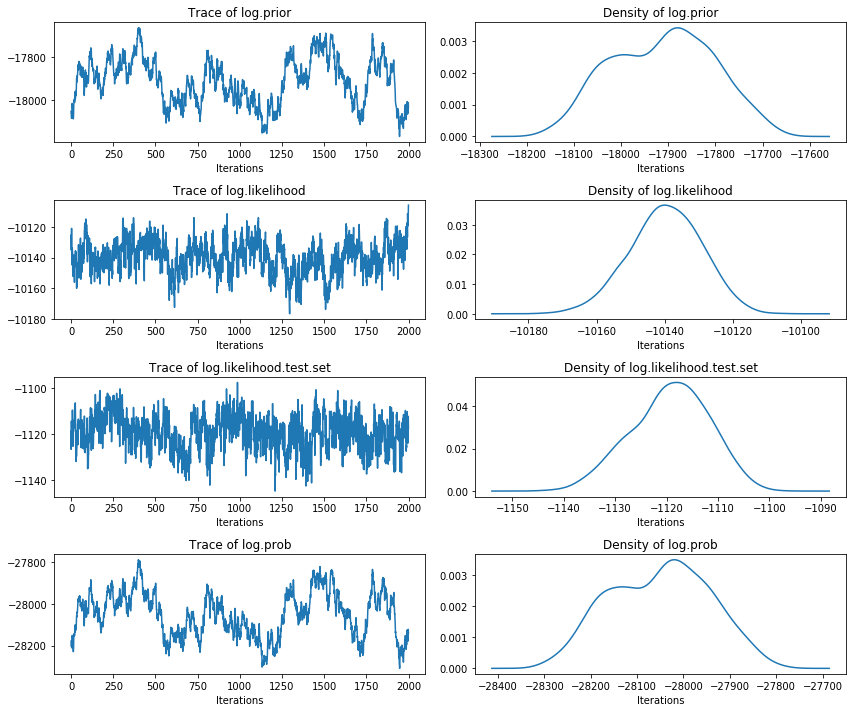

In [184]:
fig = plt.figure(figsize=[12,10])

plt.subplot(4,2,1)
plt.plot(df_log_prob['log.prior'])
plt.xlabel('Iterations')
plt.title('Trace of log.prior')

plt.subplot(4,2,2)
x,y = getDensity(df_log_prob['log.prior'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.prior')

plt.subplot(4,2,3)
plt.plot(df_log_prob['log.likelihood'])
plt.title('Trace of log.likelihood')
plt.xlabel('Iterations')
plt.tight_layout()

plt.subplot(4,2,4)
x,y = getDensity(df_log_prob['log.likelihood'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.likelihood')

plt.subplot(4,2,5)
plt.plot(df_log_prob['log.likelihood.test.set'])
plt.title('Trace of log.likelihood.test.set')
plt.xlabel('Iterations')
plt.tight_layout()

plt.subplot(4,2,6)
x,y = getDensity(df_log_prob['log.likelihood.test.set'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.likelihood.test.set')

plt.subplot(4,2,7)
plt.plot(df_log_prob['log.prior']+df_log_prob['log.likelihood'])
plt.title('Trace of log.prob')
plt.xlabel('Iterations')

plt.subplot(4,2,8)
x,y = getDensity(df_log_prob['log.prior']+df_log_prob['log.likelihood'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.prob')

plt.tight_layout()

plt.show()

### Plot the influence matrix between participants

In [185]:
A = int(np.sqrt(len(df_influence.columns))) #number of participants
id_person = {}
for p in person_id:
    id_person[person_id[p]]=p

In [186]:
def getmatrix(stacked,A):
    influence_matrix = [[0 for i in range(A)] for j in range(A)]
    for row in stacked.iteritems():
        from_ = int(row[0].split('.')[1])-1
        to_ = int(row[0].split('.')[2])-1
        value = float(row[1])
        influence_matrix[from_][to_]=value
    df_ = pandas.DataFrame(influence_matrix) 
    
    df_ =df_.rename(index = id_person)
    df_ =df_.rename(columns = id_person)
    return df_

In [187]:
stacked = df_influence.mean(axis=0)
df_mean = getmatrix(stacked,A)

stacked = df_influence.std(axis=0)
df_std = getmatrix(stacked,A)

In [188]:
df_mean

,Juror 8,Juror 3,Juror 10,Foreman,Juror 7,Juror 4,Juror 11,Juror 12,Juror 6,Juror 2,Juror 9,Juror 5
Juror 8,0.000000,3.757957,8.089079,0.930180,5.167497,0.794645,0.845335,1.336329,6.106684,0.916765,6.385205,7.300776
Juror 3,8.529312,0.000000,6.673916,4.150076,2.534751,4.902852,1.092571,0.509942,3.825015,3.861767,0.266426,1.561626
Juror 10,8.413188,7.427932,0.000000,4.540236,3.216307,1.030049,1.004598,0.529232,2.426582,0.407460,1.233599,0.885871
Foreman,1.137060,0.612615,1.945196,0.000000,1.521390,0.834870,1.338554,3.230634,1.013511,3.534036,1.311436,4.115411
Juror 7,2.603853,5.901169,0.648844,1.969868,0.000000,1.110101,0.279870,0.608548,1.047693,2.910670,1.619475,1.570038
Juror 4,5.791320,0.200669,0.266484,0.582956,0.094200,0.000000,3.347982,0.316963,0.300770,2.112033,0.370973,0.673364
Juror 11,0.378515,0.544628,0.779340,0.454645,0.290575,0.447512,0.000000,0.614536,0.821143,0.951222,0.476986,0.844157
Juror 12,5.961338,0.695831,0.519459,1.253033,0.247939,0.162463,0.388620,0.000000,2.500976,2.375977,0.481394,0.834032
Juror 6,4.526244,0.923784,0.503503,1.049825,1.288920,0.451562,0.375776,0.904313,0.000000,2.861587,0.905421,0.310822
Juror 2,0.583732,2.303417,0.529583,1.722894,2.005939,0.299311,0.652302,1.623813,0.841376,0.000000,1.691612,1.756225


MEAN of influence matrix (row=from, col=to)


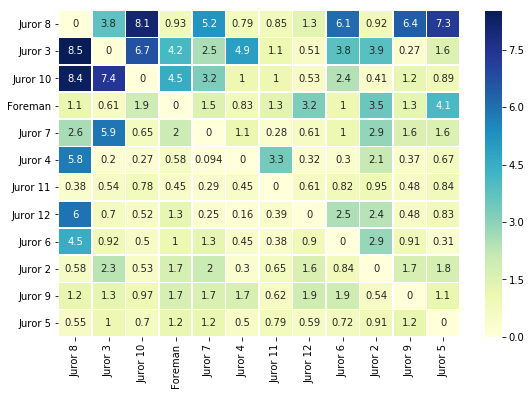

In [189]:
f, ax = plt.subplots(figsize=(9, 6))
seaborn.heatmap(df_mean, annot=True,  linewidths=.5, ax=ax,cmap="YlGnBu")
print('MEAN of influence matrix (row=from, col=to)')
plt.show()

SD of influence matrix (row=from, col=to)


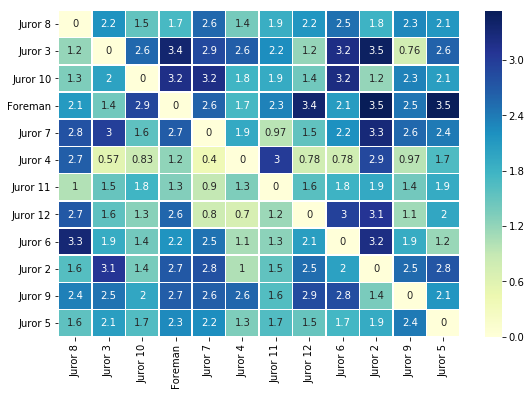

In [190]:
f, ax = plt.subplots(figsize=(9, 6))
seaborn.heatmap(df_std, annot=True,  linewidths=.5, ax=ax,cmap="YlGnBu")
print('SD of influence matrix (row=from, col=to)')
plt.show()

### Barplot of total influences sent/received

In [191]:
sender_std = {} #sd of total influence sent
reciever_std = {} #sd of total influence recieved
for i in range(A):
    reciever_std[id_person[i]] = df_influence[df_influence.columns[i::A]].sum(axis=1).std()
    sender_std[id_person[i]] = df_influence[df_influence.columns[i*A:(i+1)*A:]].sum(axis=1).std()

sent = df_mean.sum(axis=1) #mean of total influence sent
recieved =df_mean.sum(axis=0) #mean of total influence recieved

Total influence:

		Total linguistic influence sent/received 


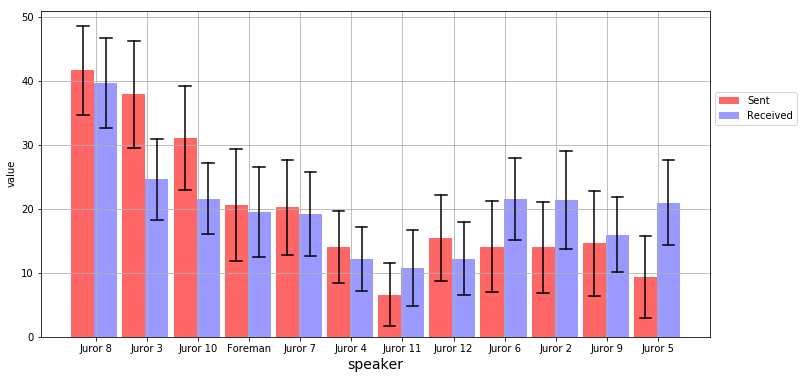

In [192]:
print ("\t\tTotal linguistic influence sent/received ")
ax.fig = plt.figure(figsize=[np.min([A,20]),6])

plt.grid()
wd=0.45
ii=0
for p in sender_std:
    plt.bar(person_id[p],sent.loc[p],width=wd,color='red',alpha=0.6,label = "Sent" if ii == 0 else "")
    plt.plot([person_id[p]-wd/4,person_id[p]+wd/4],[sent.loc[p]+sender_std[p],sent.loc[p]+sender_std[p]],color='k')
    plt.plot([person_id[p]-wd/4,person_id[p]+wd/4],[sent.loc[p]-sender_std[p],sent.loc[p]-sender_std[p]],color='k')
    plt.plot([person_id[p],person_id[p]],[sent.loc[p]-sender_std[p],sent.loc[p]+sender_std[p]],color='k')
    ii+=1
ii=0
for p in reciever_std:
    plt.bar(person_id[p]+wd,recieved.loc[p],width=wd,color='blue',alpha=0.4,label = "Received" if ii == 0 else "")
    plt.plot([person_id[p]+wd-wd/4,person_id[p]+wd+wd/4],[recieved.loc[p]+reciever_std[p],recieved.loc[p]+reciever_std[p]],color='k')
    plt.plot([person_id[p]+wd-wd/4,person_id[p]+wd+wd/4],[recieved.loc[p]-reciever_std[p],recieved.loc[p]-reciever_std[p]],color='k')
    plt.plot([person_id[p]+wd,person_id[p]+wd],[recieved.loc[p]-reciever_std[p],recieved.loc[p]+reciever_std[p]],color='k')
    ii+=1
plt.legend(loc='center left', bbox_to_anchor=(1, 0.7))
plt.xticks([i+0.25 for i in range(A)],list(zip(*sorted(id_person.items())))[1])
plt.ylabel('value')
plt.xlabel('speaker',fontsize=14)
plt.show()

## Visualize Influence Network!

You can visualize any of the influence matrices above:

Using networkx:

In [193]:
def drawNetwork(df,title):
    fig = plt.figure(figsize=[8,8])
    G = nx.DiGraph()
    for from_ in df.index:
        for to_ in df.columns:
            G.add_edge(from_,to_,weight = df.loc[from_][to_])
            
    pos = nx.spring_layout(G,k=0.55,iterations=20)
    edges,weights = zip(*nx.get_edge_attributes(G,'weight').items())
    weights = np.array(weights)
    #weights = weights*weights
    weights = 6*weights/np.max(weights)
    print(title)
    
    edge_colors=20*(weights/np.max(weights))
    edge_colors = edge_colors.astype(int)
#     nx.draw_networkx_nodes(G,pos,node_size=1200,alpha=0.7,node_color='#99cef7')
#     nx.draw_networkx_edges(G,pos,edge_color=edge_colors)
#     nx.draw_networkx_labels(G,pos,font_weight='bold')
    nx.draw(G,pos,with_labels=True, font_weight='bold',width=weights,\
            edge_color=255-edge_colors,node_color='#99cef7',node_size=1200,\
            alpha=0.75,arrows=True,arrowsize=20)
    return edge_colors

In [194]:
# get quantile influence matrices for 25%, 50%, 75% quantile
stacked = df_influence.quantile(0.25)
df_q25 = getmatrix(stacked,A)

stacked = df_influence.quantile(0.5)
df_q50 = getmatrix(stacked,A)

stacked = df_influence.quantile(0.75)
df_q75 = getmatrix(stacked,A)

Mean Influence Network


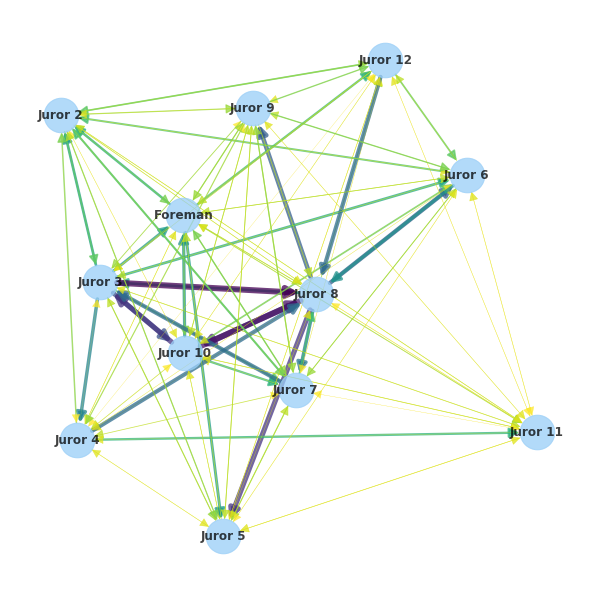

In [195]:
G_mean = drawNetwork(df_mean,'Mean Influence Network')

25 Quantile Influence Network


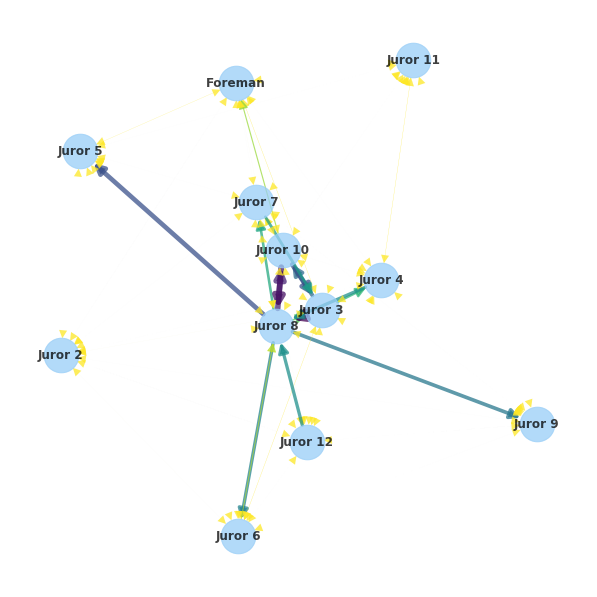

In [196]:
G_q25 = drawNetwork(df_q25,'25 Quantile Influence Network')

75 Quantile Influence Network


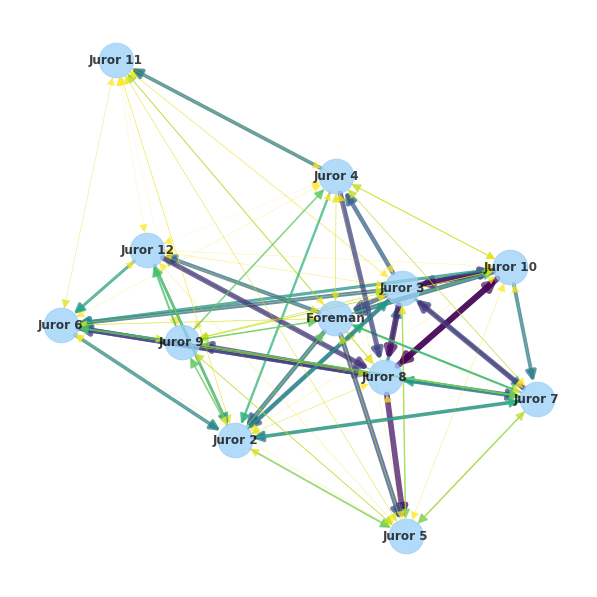

In [197]:
G_q75 = drawNetwork(df_q75,'75 Quantile Influence Network')

In [198]:
import lucem_illud_2020
import pandas
def fakeEnglish(length):
    listd=['a','b','c','d','e','f','g','s','h','i','j','k','l']
    return ''.join(np.random.choice(listd,length))

Your own dataset should contains 4 columns (with the same column names) as the artificial one below:

- name: name of the participant
- tokens: a list of tokens in one utterance
- start: starting time of utterance (unit doesn't matter, can be 'seconds','minutes','hours'...)
- end: ending time of utterance (same unit as start)

There is no need to sort data for the moment.

Below, we generate a fake collection of data from "Obama", "Trump", "Clinton"...and other recent presidents. You can either create your own simulation OR (better), add real interactional data from a online chat forum, comment chain, or transcribed from a conversation.

In [199]:
script= []
language = 'eng' #parameter, no need to tune if using English, accept:{'eng','chinese'}
role = 'Adult' #parameter, no need to tune 

for i in range(290):
    dt = []
    dt.append(np.random.choice(['Obama','Trump','Clinton','Bush','Reagan','Carter','Ford','Nixon','Kennedy','Roosevelt']))
    faketokens = [fakeEnglish(length = 4) for j in range(30)]
    dt.append(faketokens) #fake utterance
    dt.append(i*2+np.random.random()) # start time
    dt.append(i*2+1+np.random.random()) # end time
    script.append(dt)

df_transcript = pandas.DataFrame(script,columns=['name','tokens','start','end']) #"start", "end" are timestamps of utterances, units don't matter
df_transcript[:2]

,name,tokens,start,end
0,Trump,"[iejg, kgli, lleb, ihli, fbsj, ahfc, aeag, isc...",0.359317,1.970028
1,Trump,"[feag, djjs, gagb, kbba, bckd, bceh, ehia, kge...",2.182202,3.185898


Transform data into TalkbankXML format:

In [200]:
output_fname = 'USpresident.xml'  #should be .xml
language = 'eng' 
#language = 'chinese'
lucem_illud_2020.make_TalkbankXML(df_transcript, output_fname, language = language )

New File saved to .\data\USpresident\USpresident.xml


0

Run Bayesian Echo Chamber to get estimation.

- It may take a couple of hours. ( About 4-5 hours if Vocab_size=600 and sampling_time =2000)
- Larger "Vocab_size" (see below) will cost more time
- Larger "sampling_time" will also consume more time

In [201]:
Vocab_size = 90 # up to Vocab_size most frequent words will be considered, it should be smaller than the total vocab
sampling_time = 1500  #The times of Gibbs sampling sweeps  (500 burn-in not included)
lucem_illud_2020.bec_run(output_fname, Vocab_size, language, sampling_time)

## <span style="color:red">*Exercise 4*</span>

<span style="color:red">Construct cells immediately below this that perform a similar social similarity or influence analysis on a dataset relevant to your final project. Create relationships between actors in a network based on your dataset (e.g., person to person or document to document), and perform analyses that interrogate the structure of their interactions, similarity, and/or influence on one another. (For example, if relevant to your final project, you could explore different soap operas, counting how many times a character may have used the word love in conversation with another character, and identify if characters in love speak like each other. Or do opposites attract?) What does that analysis and its output reveal about the relative influence of each actor on others? What does it reveal about the social game being played?

<span style="color:red">Stretch 1:
Render the social network with weights (e.g., based on the number of scenes in which actors appear together), then calculate the most central actors in the show.Realtime output can be viewed in shell.

<span style="color:red">Stretch 2:
Implement more complex measures of similarity based on the papers you have read.

I'm not using a movie script dataset for this conversational analysis but using a fake datset.

In [279]:
import lucem_illud_2020
import pandas
def fakeEnglish(length):
    listd=['a','b','c','d','e','f','g','s','h','i','j','k','l']
    return ''.join(np.random.choice(listd,length))

# generating fake data

script= []
language = 'eng' #parameter, no need to tune if using English, accept:{'eng','chinese'}
role = 'Adult' #parameter, no need to tune 

for i in range(290):
    dt = []
    dt.append(np.random.choice(['Ann','Bea','Cat','Dee','El','Fae','Gia','Hol']))
    faketokens = [fakeEnglish(length = 4) for j in range(30)]
    dt.append(faketokens) #fake utterance
    dt.append(i*2+np.random.random()) # start time
    dt.append(i*2+1+np.random.random()) # end time
    script.append(dt)

df_transcript = pandas.DataFrame(script,columns=['name','tokens','start','end']) #"start", "end" are timestamps of utterances, units don't matter
df_transcript = df_transcript.sample(75)

In [281]:
output_fname = '8up.xml'  #should be .xml
language = 'eng' 
#language = 'chinese'
lucem_illud_2020.make_TalkbankXML(df_transcript, output_fname, language = language )

New File saved to .\data\8up\8up.xml


0

In [287]:

def bec_run(output_fname, Vocab_size, language, sampling_time):
    subprocess.call(["python", "../data/Bayesian-echo/src/run_bec.py", output_fname,str(Vocab_size),language,str(int(sampling_time))])

Vocab_size = 600 # up to Vocab_size most frequent words will be considered, it should be smaller than the total vocab
sampling_time = 2000  #The times of Gibbs sampling sweeps  (500 burn-in not included)
lucem_illud_2020.bec_run(output_fname, Vocab_size, language, sampling_time)
example_name = '8up'

In [300]:
result_path = "C:/Users/iarak/OneDrive/Desktop/Content-Analysis-2020/week-4/"

In [301]:
df_meta_info = pandas.read_table(result_path + 'meta-info.txt',header=None)
df_log_prob = pandas.read_csv(result_path + "SAMPLE-log_prior_and_log_likelihood.txt",delim_whitespace=True) #log_prob samples
df_influence = pandas.read_csv(result_path + 'SAMPLE-influence.txt',delim_whitespace=True) # influence samples
df_participants = pandas.read_csv(result_path + 'cast.txt', delim_whitespace=True)
person_id = pandas.Series(df_participants['agent.num'].values-1,index=df_participants['agent.name']).to_dict()
print()
print ('Person : ID')
person_id

FileNotFoundError: [Errno 2] File C:/Users/iarak/OneDrive/Desktop/Content-Analysis-2020/week-4/meta-info.txt does not exist: 'C:/Users/iarak/OneDrive/Desktop/Content-Analysis-2020/week-4/meta-info.txt'

In [ ]:
def getDensity(df):
    data = df#_log_prob['log.prior']
    density = scipy.stats.gaussian_kde(data)
    width = np.max(data) - np.min(data)
    xs = np.linspace(np.min(data)-width/5, np.max(data)+width/5,600)
    density.covariance_factor = lambda : .25
    density._compute_covariance()
    return xs, density(xs)

In [ ]:
fig = plt.figure(figsize=[12,10])

plt.subplot(4,2,1)
plt.plot(df_log_prob['log.prior'])
plt.xlabel('Iterations')
plt.title('Trace of log.prior')

plt.subplot(4,2,2)
x,y = getDensity(df_log_prob['log.prior'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.prior')

plt.subplot(4,2,3)
plt.plot(df_log_prob['log.likelihood'])
plt.title('Trace of log.likelihood')
plt.xlabel('Iterations')
plt.tight_layout()

plt.subplot(4,2,4)
x,y = getDensity(df_log_prob['log.likelihood'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.likelihood')

plt.subplot(4,2,5)
plt.plot(df_log_prob['log.likelihood.test.set'])
plt.title('Trace of log.likelihood.test.set')
plt.xlabel('Iterations')
plt.tight_layout()

plt.subplot(4,2,6)
x,y = getDensity(df_log_prob['log.likelihood.test.set'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.likelihood.test.set')

plt.subplot(4,2,7)
plt.plot(df_log_prob['log.prior']+df_log_prob['log.likelihood'])
plt.title('Trace of log.prob')
plt.xlabel('Iterations')

plt.subplot(4,2,8)
x,y = getDensity(df_log_prob['log.prior']+df_log_prob['log.likelihood'])
plt.plot(x,y)
plt.xlabel('Iterations')
plt.title('Density of log.prob')

plt.tight_layout()

plt.show()

In [ ]:
A = int(np.sqrt(len(df_influence.columns))) #number of participants
id_person = {}
for p in person_id:
    id_person[person_id[p]]=p

In [ ]:
def getmatrix(stacked,A):
    influence_matrix = [[0 for i in range(A)] for j in range(A)]
    for row in stacked.iteritems():
        from_ = int(row[0].split('.')[1])-1
        to_ = int(row[0].split('.')[2])-1
        value = float(row[1])
        influence_matrix[from_][to_]=value
    df_ = pandas.DataFrame(influence_matrix) 
    
    df_ =df_.rename(index = id_person)
    df_ =df_.rename(columns = id_person)
    return df_

In [ ]:
stacked = df_influence.mean(axis=0)
df_mean = getmatrix(stacked,A)

stacked = df_influence.std(axis=0)
df_std = getmatrix(stacked,A)

In [ ]:
df_mean

In [ ]:
f, ax = plt.subplots(figsize=(9, 6))
seaborn.heatmap(df_mean, annot=True,  linewidths=.5, ax=ax,cmap="YlGnBu")
print('MEAN of influence matrix (row=from, col=to)')
plt.show()

In [ ]:
f, ax = plt.subplots(figsize=(9, 6))
seaborn.heatmap(df_std, annot=True,  linewidths=.5, ax=ax,cmap="YlGnBu")
print('SD of influence matrix (row=from, col=to)')
plt.show()

In [ ]:
sender_std = {} #sd of total influence sent
reciever_std = {} #sd of total influence recieved
for i in range(A):
    reciever_std[id_person[i]] = df_influence[df_influence.columns[i::A]].sum(axis=1).std()
    sender_std[id_person[i]] = df_influence[df_influence.columns[i*A:(i+1)*A:]].sum(axis=1).std()

sent = df_mean.sum(axis=1) #mean of total influence sent
recieved =df_mean.sum(axis=0) #mean of total influence recieved

In [ ]:
print ("\t\tTotal linguistic influence sent/received ")
ax.fig = plt.figure(figsize=[np.min([A,20]),6])

plt.grid()
wd=0.45
ii=0
for p in sender_std:
    plt.bar(person_id[p],sent.loc[p],width=wd,color='red',alpha=0.6,label = "Sent" if ii == 0 else "")
    plt.plot([person_id[p]-wd/4,person_id[p]+wd/4],[sent.loc[p]+sender_std[p],sent.loc[p]+sender_std[p]],color='k')
    plt.plot([person_id[p]-wd/4,person_id[p]+wd/4],[sent.loc[p]-sender_std[p],sent.loc[p]-sender_std[p]],color='k')
    plt.plot([person_id[p],person_id[p]],[sent.loc[p]-sender_std[p],sent.loc[p]+sender_std[p]],color='k')
    ii+=1
ii=0
for p in reciever_std:
    plt.bar(person_id[p]+wd,recieved.loc[p],width=wd,color='blue',alpha=0.4,label = "Received" if ii == 0 else "")
    plt.plot([person_id[p]+wd-wd/4,person_id[p]+wd+wd/4],[recieved.loc[p]+reciever_std[p],recieved.loc[p]+reciever_std[p]],color='k')
    plt.plot([person_id[p]+wd-wd/4,person_id[p]+wd+wd/4],[recieved.loc[p]-reciever_std[p],recieved.loc[p]-reciever_std[p]],color='k')
    plt.plot([person_id[p]+wd,person_id[p]+wd],[recieved.loc[p]-reciever_std[p],recieved.loc[p]+reciever_std[p]],color='k')
    ii+=1
plt.legend(loc='center left', bbox_to_anchor=(1, 0.7))
plt.xticks([i+0.25 for i in range(A)],list(zip(*sorted(id_person.items())))[1])
plt.ylabel('value')
plt.xlabel('speaker',fontsize=14)
plt.show()

In [ ]:
def drawNetwork(df,title):
    fig = plt.figure(figsize=[8,8])
    G = nx.DiGraph()
    for from_ in df.index:
        for to_ in df.columns:
            G.add_edge(from_,to_,weight = df.loc[from_][to_])
            
    pos = nx.spring_layout(G,k=0.55,iterations=20)
    edges,weights = zip(*nx.get_edge_attributes(G,'weight').items())
    weights = np.array(weights)
    #weights = weights*weights
    weights = 6*weights/np.max(weights)
    print(title)
    
    edge_colors=20*(weights/np.max(weights))
    edge_colors = edge_colors.astype(int)
#     nx.draw_networkx_nodes(G,pos,node_size=1200,alpha=0.7,node_color='#99cef7')
#     nx.draw_networkx_edges(G,pos,edge_color=edge_colors)
#     nx.draw_networkx_labels(G,pos,font_weight='bold')
    nx.draw(G,pos,with_labels=True, font_weight='bold',width=weights,\
            edge_color=255-edge_colors,node_color='#99cef7',node_size=1200,\
            alpha=0.75,arrows=True,arrowsize=20)
    return edge_colors

In [ ]:
# get quantile influence matrices for 25%, 50%, 75% quantile
stacked = df_influence.quantile(0.25)
df_q25 = getmatrix(stacked,A)

stacked = df_influence.quantile(0.5)
df_q50 = getmatrix(stacked,A)

stacked = df_influence.quantile(0.75)
df_q75 = getmatrix(stacked,A)

In [ ]:
G_mean = drawNetwork(df_mean,'Mean Influence Network')
